# Scraping for ideal data science competence profile
## Part two: Text mining

In [ ]:
## Prepare the environment
# Setup environment variables
SEED = 44
DATA_PATH = 'drive/MyDrive/Colab Notebooks/ScrapingForIdeal'

# Import Python extensions
import os
from collections import Counter
from datetime import datetime
import itertools

# Import data libraries
import numpy as np
import pandas as pd

# Import viz libraries
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx

# Import sklearn modules for kmeans text clustering
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE

In [ ]:
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
import string

In [ ]:
!pip install scattertext

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.2/8.2 MB 8.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for flashtext: filename=flashtext-2.7-py2.py3-none-any.whl size=9296 sha256=30e9da18c3acdf25a9934f8e6a7d6a67509f0df93ffe0abd04f106360991e2f7
  Stored in directory: /root/.cache/pip/wheels/bc/be/39/c37ad168eb2ff644c9685f52554440372129450f0b8ed203dd
Successfully built flashtext


In [ ]:
!python -m spacy download en_core_web_md

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.8/42.8 MB 40.5 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_md')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.


In [ ]:
import spacy
import scattertext

In [ ]:
import IPython

In [ ]:
# Get file's index
FILE_INDEX = os.listdir(DATA_PATH).index('it_protocol_dataset_2024_03_02__06_37_15.csv')

# Load the dataset
working_df = pd.read_csv(
    os.path.join(DATA_PATH, os.listdir(DATA_PATH)[FILE_INDEX]),
    index_col=False
)

In [ ]:
working_df.head(3)

,Unnamed: 0,section-contract,section-workplace,section-technologies,section-responsibilities,section-requirements,title,link
0,0,salary not specified\n \nB2B contract (full-time),"Kraków, Grzegórzki\nFabryczna 1",Technologies we use\nExpected\nPython\nSQL,Your responsibilities\n- Apply data science te...,Our requirements\nMaster's degree in a quantit...,"Praca Data Scientist , Star Beta Poland sp. z ...",https://theprotocol.it/szczegoly/praca/data-sc...
1,1,salary not specified\n \ncontract of employmen...,"Kraków, Grzegórzki\nLubicz 23a",Technologies we use\nExpected\nPython\nGoogle ...,Your responsibilities\nThe main responsibility...,Our requirements\nDeep practical knowledge of ...,"Praca Data Scientist AI Governance, ALTEN Pols...",https://theprotocol.it/szczegoly/praca/data-sc...
2,2,16 000\n–\n25 000\n \nzł\ngross\n \n/\n \nmth....,"Wrocław, Fabryczna\nWagonowa 2d",Technologies we use\nExpected\nPython\nMachine...,Your responsibilities\nContribute to the desig...,Our requirements\nPython / C++ development\nDa...,"Praca Machine Learning Engineer, Zone IT Sp. z...",https://theprotocol.it/szczegoly/praca/machine...


## 5. Required vs optional technologies analysis

Since types of tech required and preferred by emloyers is crucial, we will start our data-minig with `section-technologies` column. Below we will analyze occurence of required and optional tech and cooccurence of these categories of tech inside those categories and between them.

### 5.1. Required techs (co-) occurence

### 5.1.1. Sort technologies to required and optional

In [ ]:
# Create function to sort technologies to required and optional and save the into separate columns
def split_technologies(row):
    required_tech = []
    optional_tech = []
    is_expected = False
    is_optional = False
    is_operating_system = False
    for item in row.removeprefix('Technologies we use').split('\n'):
        if (item == 'Expected') or (item == 'Required') :
            is_expected = True
            is_optional = False
            continue
        elif (item == 'Optional') or (item == 'Welcome'):
            is_optional = True
            is_expected = False
            continue
        elif item == 'Operating system':
            is_operating_system = True
            continue
        if is_expected and not is_operating_system:
            required_tech.append(item)
        elif is_optional and not is_operating_system:
            optional_tech.append(item)
        else:
            is_operating_system=False
            continue
    try:
        required_tech.remove('')
    except Exception as e:
        print(e)
    finally:
        pass
    return pd.Series({'section-technologies-required': required_tech, 'section-technologies-optional': optional_tech})


In [ ]:
# Apply the function to each row
working_df[['section-technologies-required', 'section-technologies-optional']] = working_df['section-technologies'].apply(split_technologies)

list.remove(x): x not in list
list.remove(x): x not in list
list.remove(x): x not in list
list.remove(x): x not in list
list.remove(x): x not in list
list.remove(x): x not in list
list.remove(x): x not in list
list.remove(x): x not in list
list.remove(x): x not in list
list.remove(x): x not in list
list.remove(x): x not in list
list.remove(x): x not in list
list.remove(x): x not in list
list.remove(x): x not in list
list.remove(x): x not in list
list.remove(x): x not in list
list.remove(x): x not in list
list.remove(x): x not in list
list.remove(x): x not in list
list.remove(x): x not in list
list.remove(x): x not in list
list.remove(x): x not in list
list.remove(x): x not in list
list.remove(x): x not in list
list.remove(x): x not in list
list.remove(x): x not in list
list.remove(x): x not in list
list.remove(x): x not in list
list.remove(x): x not in list
list.remove(x): x not in list
list.remove(x): x not in list
list.remove(x): x not in list
list.remove(x): x not in list
list.remov

In [ ]:
sum(working_df['section-technologies-required'].value_counts().values) == len(working_df)

True

In [ ]:
working_df['section-technologies-required'].value_counts()[:10]

[]                                                                                29
[Python]                                                                          21
[SQL]                                                                             13
[Python, PyTorch, Tensorflow, Numpy, Pandas, Matplotlib]                          12
[SQL, Python]                                                                     10
[Hadoop, Python, Scala, Java, SQL, Maven]                                         10
[Python, SQL, Microsoft Azure, AWS, Google Cloud Platform, Microsoft Power BI]     8
[Python, Machine Learning]                                                         8
[Python, NumPy, Pandas, GitHub, Microsoft SQL Server, Azure Cosmos DB]             8
[Microsoft Office, Power Query, VBA, Power BI, Tableau, SQL]                       8
Name: section-technologies-required, dtype: int64

### 5.1.2. Create co-occurence matrix

In [ ]:
# Create index for co-occurence matrix
tech_list_req = []
for value in working_df['section-technologies-required']:
  tech_list_req.extend(value)

tech_index_req = sorted(list(set(tech_list_req)))

In [ ]:
# Count number of times given tech occurs
tech_occurence_dict = Counter(tech_list_req)

In [ ]:
# Create blank co-occurence matrix
tech_req_cooc_matrix = pd.DataFrame(
    index=tech_index_req,
    columns=tech_index_req,
    data=np.zeros(
        shape=(len(tech_index_req), len(tech_index_req))
    ),
    dtype=np.int_
)

In [ ]:
# Count the numbers of occurences
list_of_coocc_tuples = []

for row in working_df['section-technologies-required']:
  for a_tuple in itertools.combinations(row, 2):
    # Secure that all pair-combinations are saved one-way
    a_tuple = tuple(set(a_tuple))
    list_of_coocc_tuples.append(a_tuple)

In [ ]:
# Count the number of cooccurences
number_of_coocs = Counter(list_of_coocc_tuples)

In [ ]:
# Check for false tuples
for x, y in number_of_coocs.items():
  if len(x) == 1:
    print(x)

('Linux',)


In [ ]:
# Append cooc matrix
for key, value in number_of_coocs.items():
  if len(key)>1:
    tech_req_cooc_matrix.loc[key[0], key[1]] += int(value)

In [ ]:
# Set the style parameters for this project
dark_green = sns.color_palette("dark:#5A9_r", as_cmap=True)
custom = {
    "grid.linestyle": "dashed",
    "grid.color": "darkgrey",
    'grid.linewidth': 0.3,
    'patch.linewidth': 1.15
}
title_font_dct = {
    'color':'black',
    'weight': 'normal',
    'size': 14
}

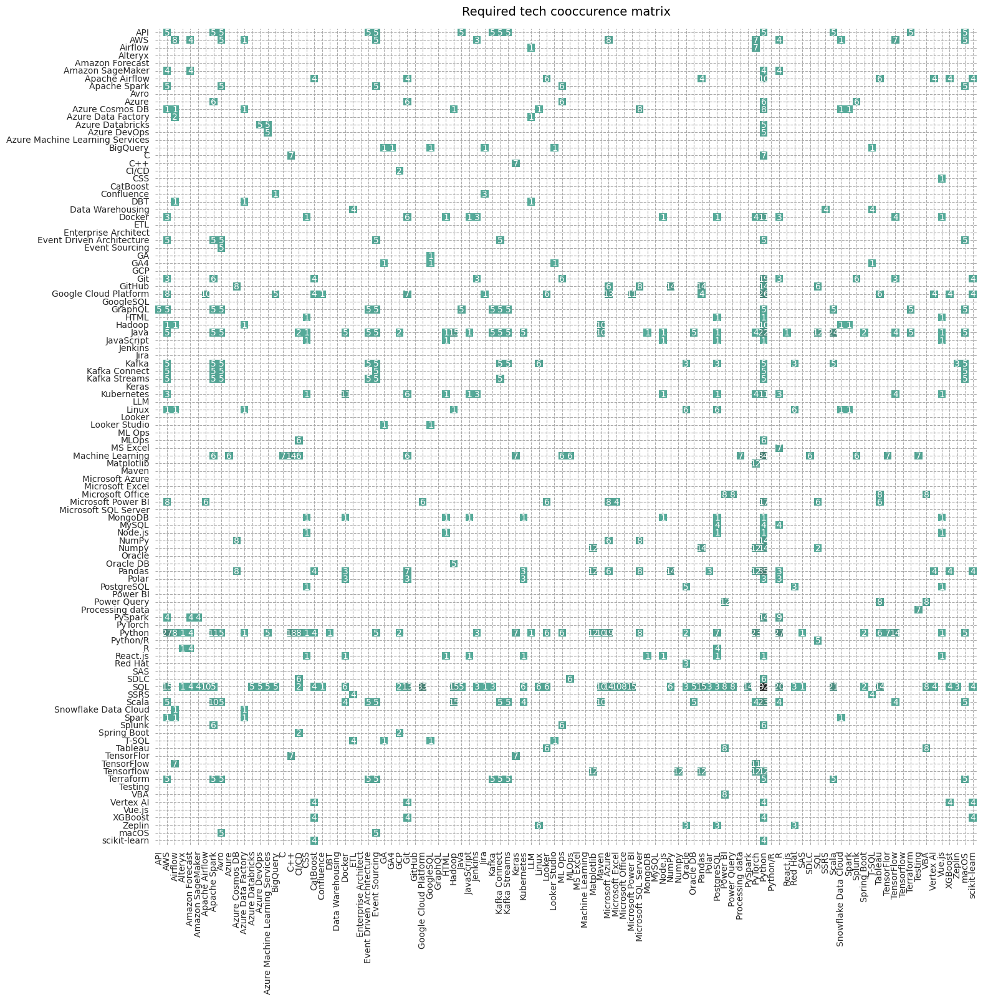

In [ ]:
# Set style
sns.set_style("whitegrid", rc = custom)

# Let's mask zeros
mask_coocc_req = np.array(~(tech_req_cooc_matrix[tech_req_cooc_matrix == 0].astype(bool)))

# Plot the matrix
fig, axs = plt.subplots(figsize=(17, 17))
sns.heatmap(tech_req_cooc_matrix, cmap=dark_green, annot=True, ax=axs, mask=mask_coocc_req, xticklabels=True, yticklabels=True, cbar=False)
plt.title('Required tech cooccurence matrix', fontdict=title_font_dct, y=1.01)
plt.show()

---

Above matrix needs some modification. The method, step=by-step is shown below.

---

In [ ]:
np.arange(16).reshape(4,4)

array([[ 0,  1,  2,  3],
       [ 4,  5,  6,  7],
       [ 8,  9, 10, 11],
       [12, 13, 14, 15]])

In [ ]:
np.arange(16).reshape(4,4) + np.arange(16).reshape(4,4).T

array([[ 0,  5, 10, 15],
       [ 5, 10, 15, 20],
       [10, 15, 20, 25],
       [15, 20, 25, 30]])

In [ ]:
np.tril(np.arange(16).reshape(4,4) + np.arange(16).reshape(4,4).T)

array([[ 0,  0,  0,  0],
       [ 5, 10,  0,  0],
       [10, 15, 20,  0],
       [15, 20, 25, 30]])

In [ ]:
ex = np.tril(np.arange(16).reshape(4,4) + np.arange(16).reshape(4,4).T)

In [ ]:
ex

array([[ 0,  0,  0,  0],
       [ 5, 10,  0,  0],
       [10, 15, 20,  0],
       [15, 20, 25, 30]])

In [ ]:
np.fill_diagonal(ex,0)

In [ ]:
ex

array([[ 0,  0,  0,  0],
       [ 5,  0,  0,  0],
       [10, 15,  0,  0],
       [15, 20, 25,  0]])

---

In [ ]:
# Reapeate the above on cooccurence matrix
new_tech_req_coocc_matrix = np.tril(tech_req_cooc_matrix.to_numpy() + tech_req_cooc_matrix.to_numpy().T)
print(new_tech_req_coocc_matrix)

[[0 0 0 ... 0 0 0]
 [5 0 0 ... 0 0 0]
 [0 8 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [5 5 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [ ]:
np.fill_diagonal(new_tech_req_coocc_matrix, 0)

In [ ]:
# Create updated cooc matrix df
required_tech_cooc_df = pd.DataFrame(
    new_tech_req_coocc_matrix,
    columns=tech_req_cooc_matrix.columns,
    index=tech_req_cooc_matrix.index
)

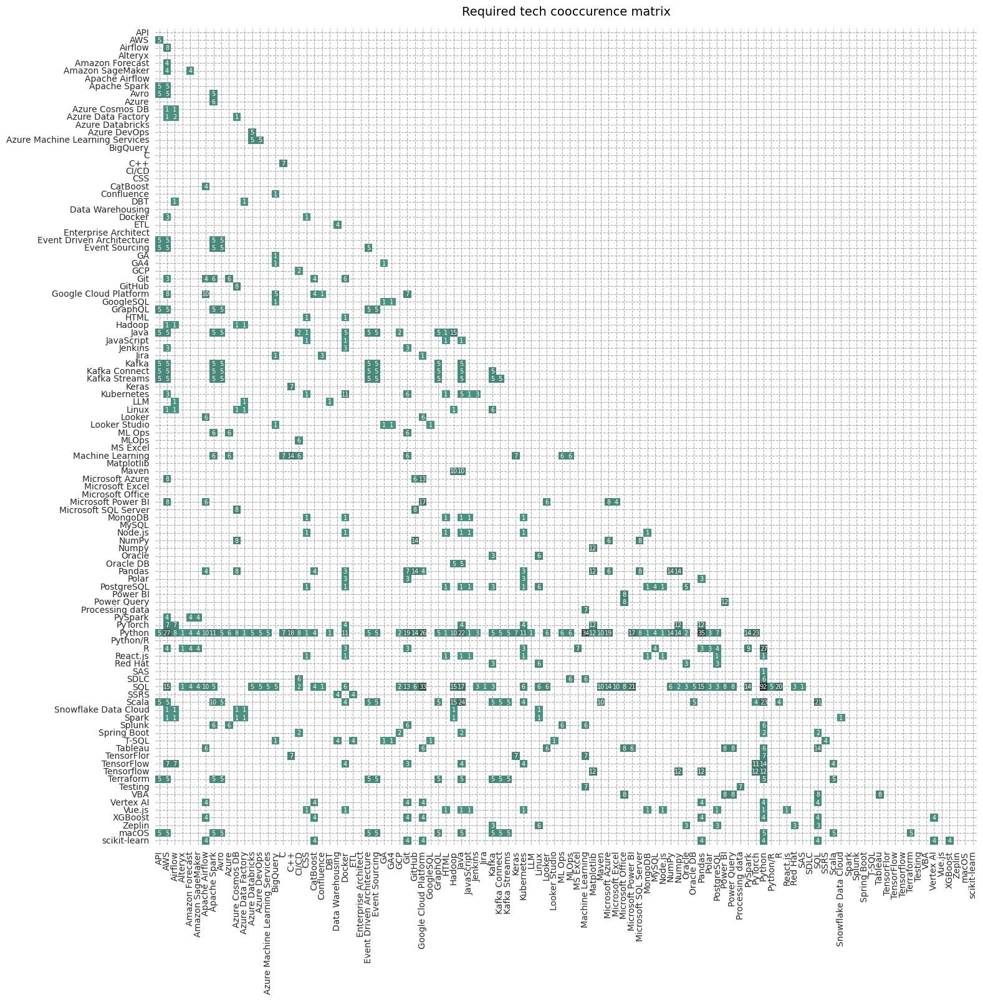

In [ ]:
sns.set_style("whitegrid", rc = custom)
# Let's mask zeros
mask_coocc_req_2 = np.array(~(required_tech_cooc_df[required_tech_cooc_df == 0].astype(bool)))

fig, axs = plt.subplots(figsize=(17, 17))

sns.heatmap(
    required_tech_cooc_df,
    cmap=dark_green,
    annot=True, ax=axs,
    mask=mask_coocc_req_2,
    vmin=-10,
    vmax=50,
    xticklabels=True,
    yticklabels=True,
    cbar=False,
    annot_kws=dict(size=7)
)
plt.title('Required tech cooccurence matrix', fontdict=title_font_dct, y=1.01)
plt.show()

In [ ]:
# Check if the transformation was correct
tech_req_cooc_matrix.loc[:, 'Apache Spark'].sum() + tech_req_cooc_matrix.loc['Apache Spark', :].sum() == required_tech_cooc_df.loc[:, 'Apache Spark'].sum() + required_tech_cooc_df.loc['Apache Spark', :].sum()

True

### 5.1.3. Count the number of required tech occurences

In [ ]:
# Create a series that shows, how many times give tech occurs
required_tech_occ_S = pd.Series(tech_occurence_dict).sort_index()

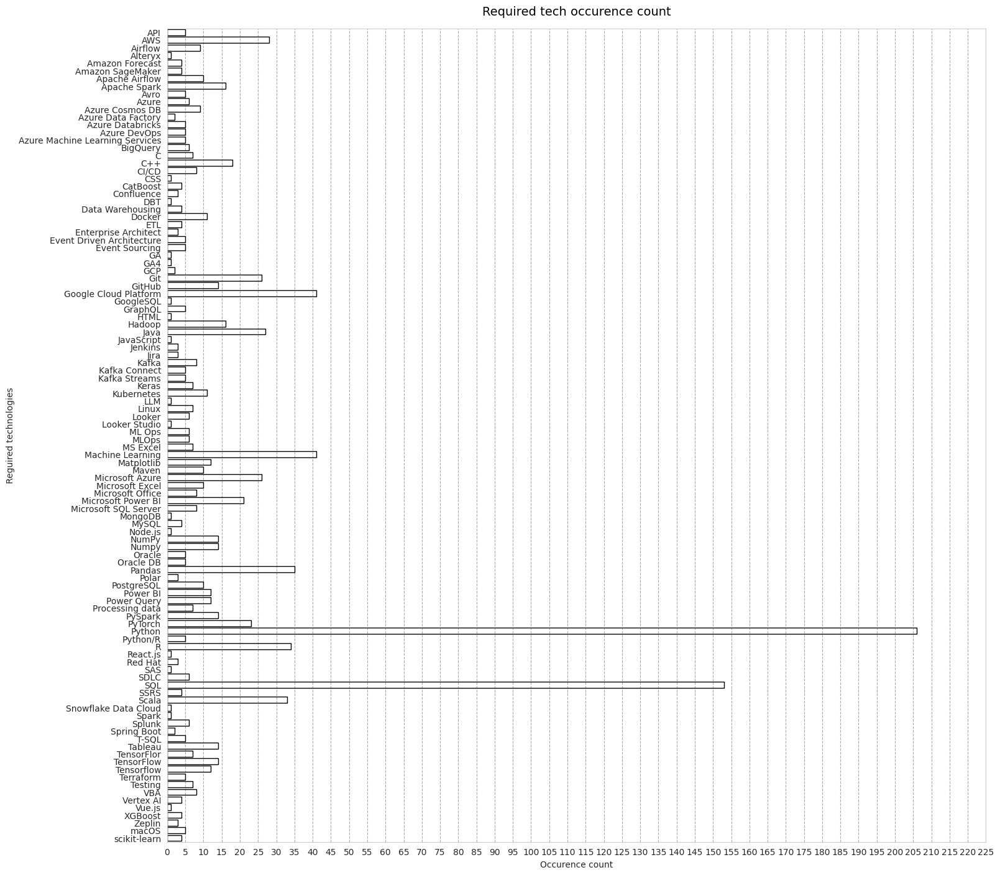

In [ ]:
sns.set_style("whitegrid", rc = custom)

fig, axs = plt.subplots(figsize=(17, 17))
sns.barplot(x = required_tech_occ_S, y = required_tech_occ_S.index, ax=axs, facecolor='none', edgecolor='black')
plt.title('Required tech occurence count', fontdict=title_font_dct, y=1.01)
plt.xticks(np.arange(0, 230, 5))
plt.xlabel('Occurence count')
plt.ylabel('Reguired technologies')
plt.show()

### 5.1.4. Count the number of required tech cooccurences

In [ ]:
# Count the number that given tech coocuts with any other tech
required_tech_cooc_dct = {}
for name in tech_req_cooc_matrix.columns:
  required_tech_cooc_dct[name] = tech_req_cooc_matrix.loc[:, name].sum() + tech_req_cooc_matrix.loc[name, :].sum()

In [ ]:
required_tech_cooc_S = pd.Series(required_tech_cooc_dct)

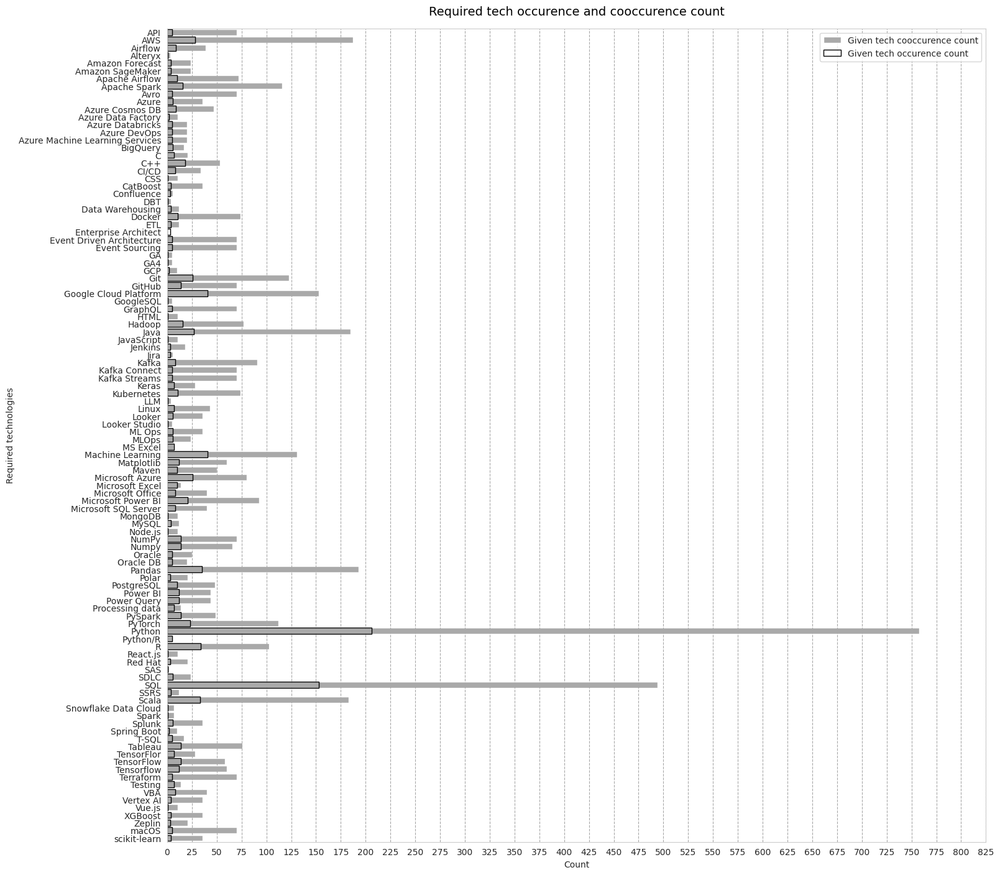

In [ ]:
sns.set_style("whitegrid", rc = custom)

fig, axs = plt.subplots(figsize=(17, 17))
sns.barplot(x = required_tech_cooc_S, y = required_tech_cooc_S.index, ax=axs,facecolor='darkgrey', zorder=0, label='Given tech cooccurence count')
sns.barplot(x = required_tech_occ_S, y = required_tech_occ_S.index, ax=axs, facecolor='none', edgecolor='black', linewidth=1, zorder=1, label='Given tech occurence count')
plt.title('Required tech occurence and cooccurence count', fontdict=title_font_dct, y=1.01)
plt.xticks(np.arange(0, 850, 25))
plt.xlabel('Count')
plt.ylabel('Required technologies')
plt.show()

### 5.1.5. Create cooccurrence network

The coocurence matrix and bar charts above are good, but not the best way to show tech cooccurence in job offers. Shell layout graph literally puts realtions between technologies mentioned in job offers at the center of inquiry.

In [ ]:
# Initialize a NetworkX graph
G = nx.Graph()

# Add edges to the graph
for pair, count in number_of_coocs.items():
  if len(pair)>1:
    tech1, tech2 = pair
    G.add_edge(tech1, tech2, weight=count)

# Set node sizes based on co-occurrence counts
node_sizes = np.array([required_tech_cooc_dct[tech] for tech in  G.nodes()])

# Set edge weights
edge_widths = np.array([count for _, _, count in G.edges(data='weight')])

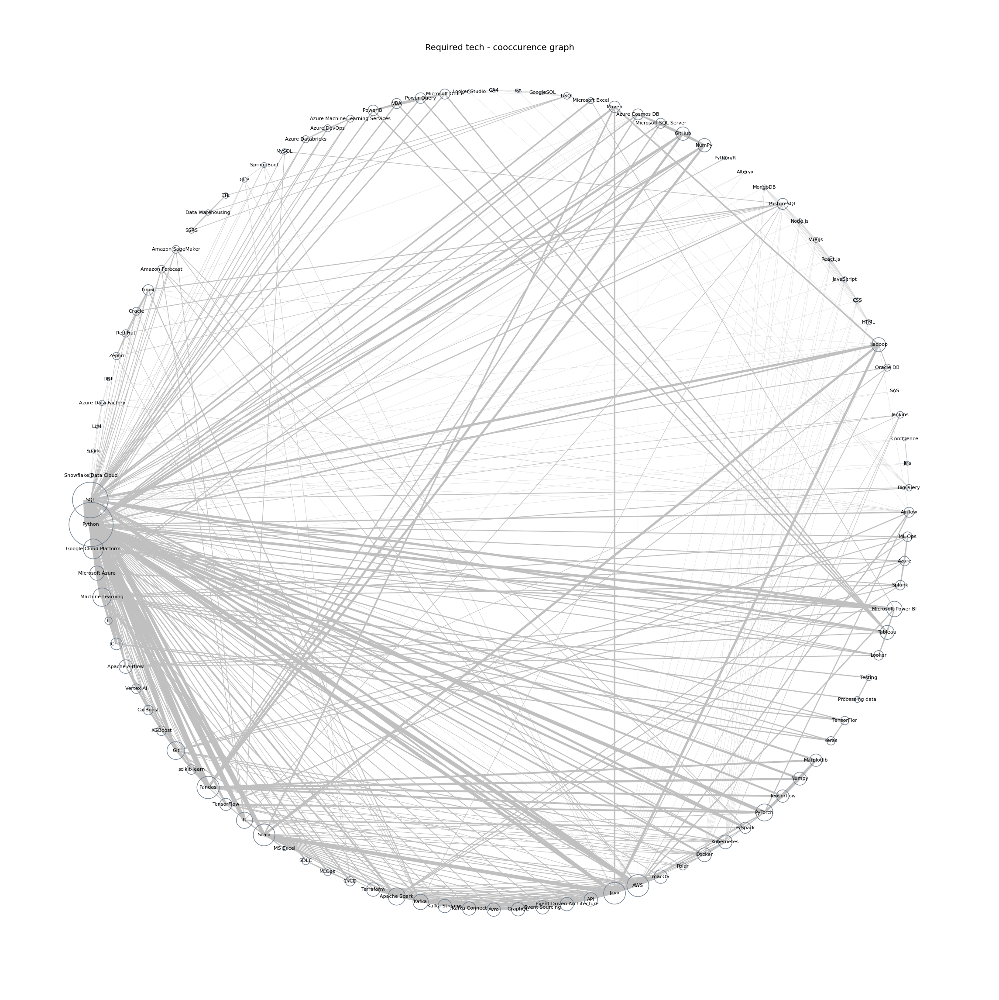

In [ ]:
# Plot the graph showing coocurence power
sns.set_style("whitegrid", rc = custom)

fig, ax = plt.subplots(figsize=(23, 23))
pos = nx.shell_layout(G)  # Define the layout of the nodes
nx.draw(G, pos, with_labels=True, node_size=node_sizes*7, width=edge_widths/4, node_color='none', edge_color='silver', edgecolors='slategrey', font_size=8)
edge_labels = nx.get_edge_attributes(G, 'weight')
ax.set_aspect('equal')
plt.tight_layout()
plt.title('Required tech - cooccurence graph', y=.95, fontdict=title_font_dct)
plt.show()

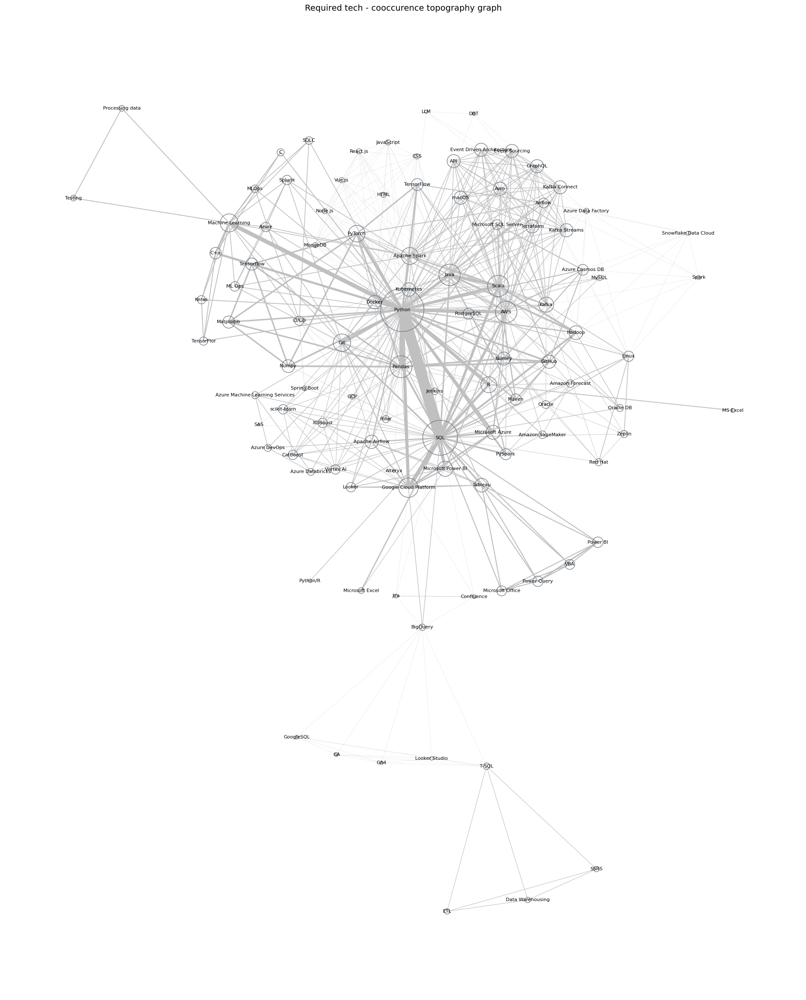

In [ ]:
# Plot the graph showing coocurence power
sns.set_style("whitegrid", rc = custom)

fig, ax = plt.subplots(figsize=(23, 23))
pos = nx.kamada_kawai_layout(G, weight=.001, scale=.0001)  # Define the layout of the nodes
nx.draw(G, pos, with_labels=True, node_size=node_sizes*7, width=edge_widths/5, node_color='none', edge_color='silver', edgecolors='slategrey', font_size=8)
edge_labels = nx.get_edge_attributes(G, 'weight')
ax.set_aspect('equal')
plt.tight_layout()
plt.title('Required tech - cooccurence topography graph', y=1.01, fontdict=title_font_dct)
plt.show()

### 5.2. Analyze optional technologies (co-)occurence

In [ ]:
# Create index for co-occurence matrix
tech_list_opt = []
for value in working_df['section-technologies-optional']:
  tech_list_opt.extend(value)

tech_index_opt = sorted(list(set(tech_list_opt)))

In [ ]:
# Count number of times given tech occurs
tech_optional_occurence_dict = Counter(tech_list_opt)

In [ ]:
list_of_coocc_tuples = []
# Count the number of occurences
for row in working_df['section-technologies-optional']:
  for a_tuple in itertools.combinations(row, 2):
    # Secure that all pair-combinations are saved one-way
    a_tuple = tuple(set(a_tuple))
    list_of_coocc_tuples.append(a_tuple)


In [ ]:
# Count the number of cooscurences
number_of_cooocs_optional = Counter(list_of_coocc_tuples)

In [ ]:
# Create blank cooccurence matrix
tech_opt_coocc_matrix = pd.DataFrame(
    index=tech_index_opt,
    columns=tech_index_opt,
    data=np.zeros(
        shape=(len(tech_index_opt),
               len(tech_index_opt)),
        dtype=np.int_
        )
    )

In [ ]:
# Populate the matrix
for key, value in number_of_cooocs_optional.items():
  tech_opt_coocc_matrix.loc[key[0], key[1]] += int(value)

In [ ]:
tech_opt_coocc_matrix.loc['Python', :].sum() + tech_opt_coocc_matrix.loc[:, 'Python'].sum()

93

In [ ]:
new_tech_opt_coocc_matrix = np.tril(tech_opt_coocc_matrix.to_numpy() + tech_opt_coocc_matrix.to_numpy().T)
np.fill_diagonal(
    new_tech_opt_coocc_matrix, 0
)

In [ ]:
requirements_optional_coocmat_df = pd.DataFrame(new_tech_opt_coocc_matrix, columns=tech_opt_coocc_matrix.columns, index=tech_opt_coocc_matrix.index)

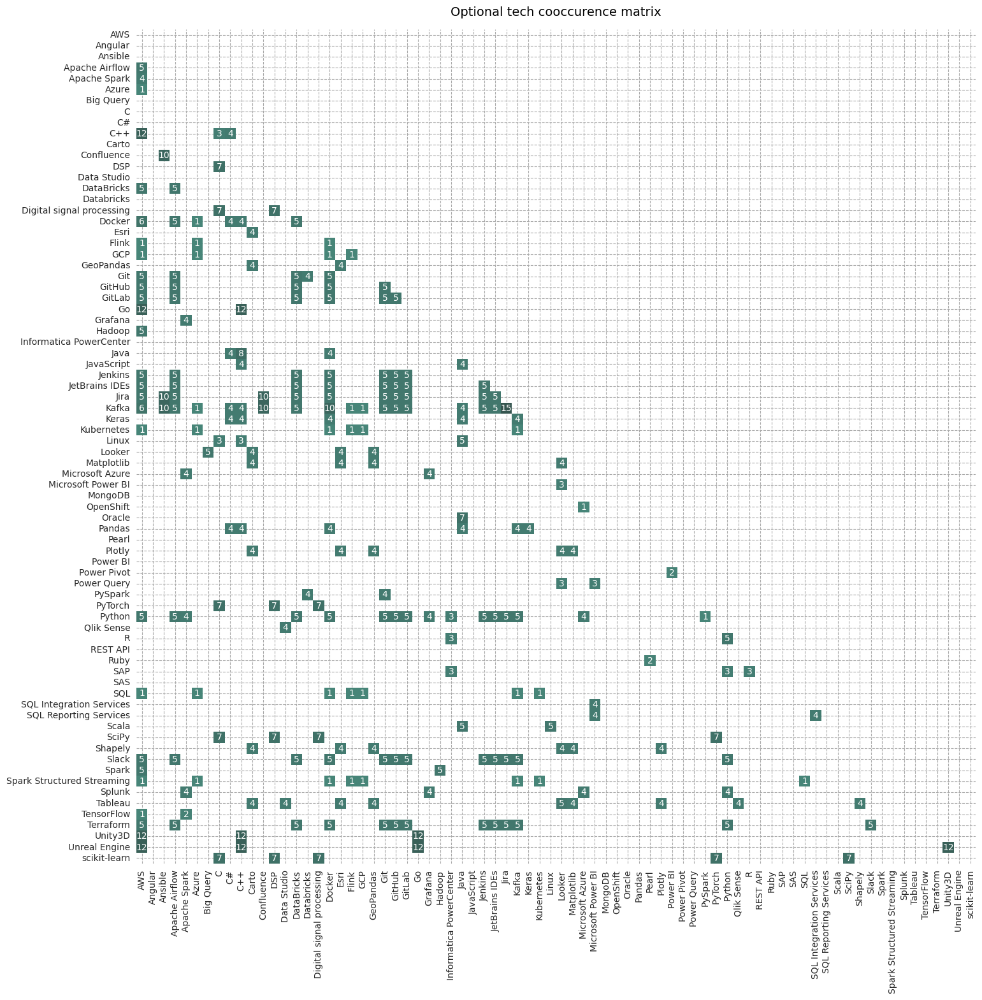

In [ ]:
sns.set_style("whitegrid", rc = custom)
# Let's mask zeros
mask_coocc_req_2 = np.array(~(requirements_optional_coocmat_df[requirements_optional_coocmat_df == 0].astype(bool)))

fig, axs = plt.subplots(figsize=(17, 17))

sns.heatmap(requirements_optional_coocmat_df, cmap=dark_green, annot=True, ax=axs, mask=mask_coocc_req_2, vmin=-10, vmax=29, xticklabels=True, yticklabels=True, cbar=False)
plt.title('Optional tech cooccurence matrix', fontdict=title_font_dct, y=1.01)
plt.show()

### 5.2.2. Count the number of optional tech occurences.

In [ ]:
# Create a series that shows, how many times given tech occurs
optional_tech_occ_S = pd.Series(tech_optional_occurence_dict).sort_index()

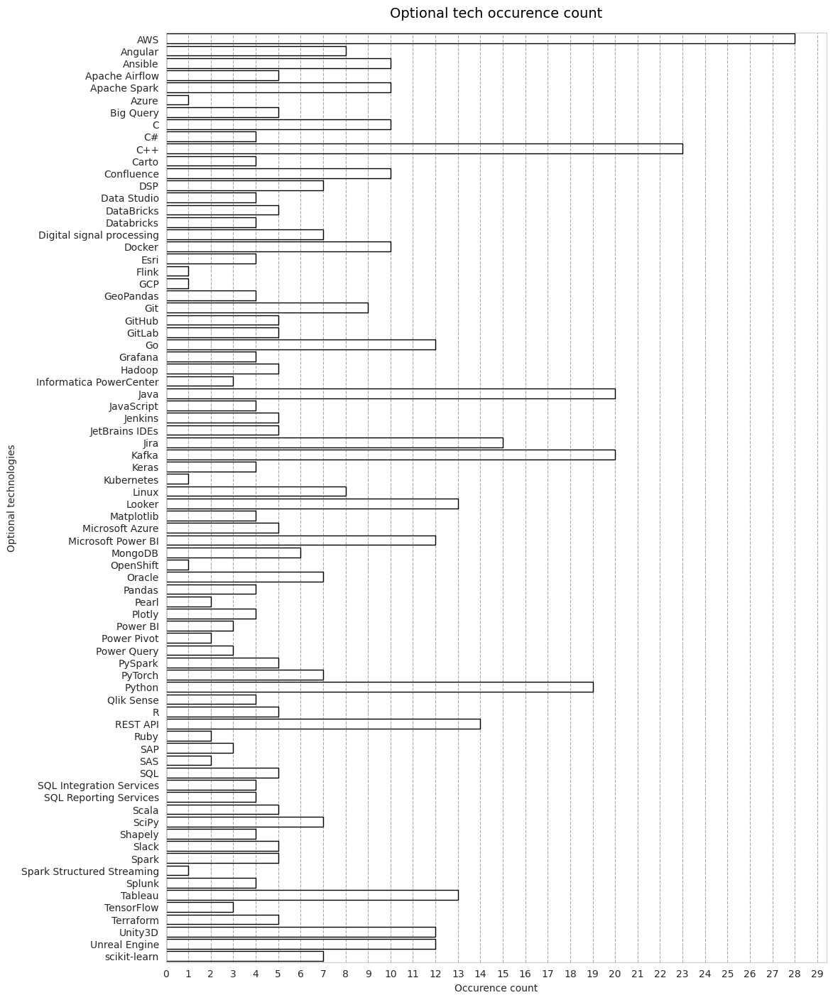

In [ ]:
sns.set_style("whitegrid", rc = custom)

fig, axs = plt.subplots(figsize=(12, 17))
sns.barplot(x = optional_tech_occ_S, y = optional_tech_occ_S.index, ax=axs, facecolor='none', edgecolor='black')
plt.title('Optional tech occurence count', fontdict=title_font_dct, y=1.01)
plt.xticks(np.arange(0, 30, 1))
plt.xlabel('Occurence count')
plt.ylabel('Optional technologies')
plt.show()

### 5.2.3. Count the number of optional tech cooccurences.

In [ ]:
# Count the number that given tech coocuts with any other tech
optional_tech_cooc_dct = {}
for name in tech_opt_coocc_matrix.columns:
  optional_tech_cooc_dct[name] = tech_opt_coocc_matrix.loc[:, name].sum() + tech_opt_coocc_matrix.loc[name, :].sum()

In [ ]:
# Create a series with optional tech cooccurences
optional_tech_cooc_S = pd.Series(optional_tech_cooc_dct)

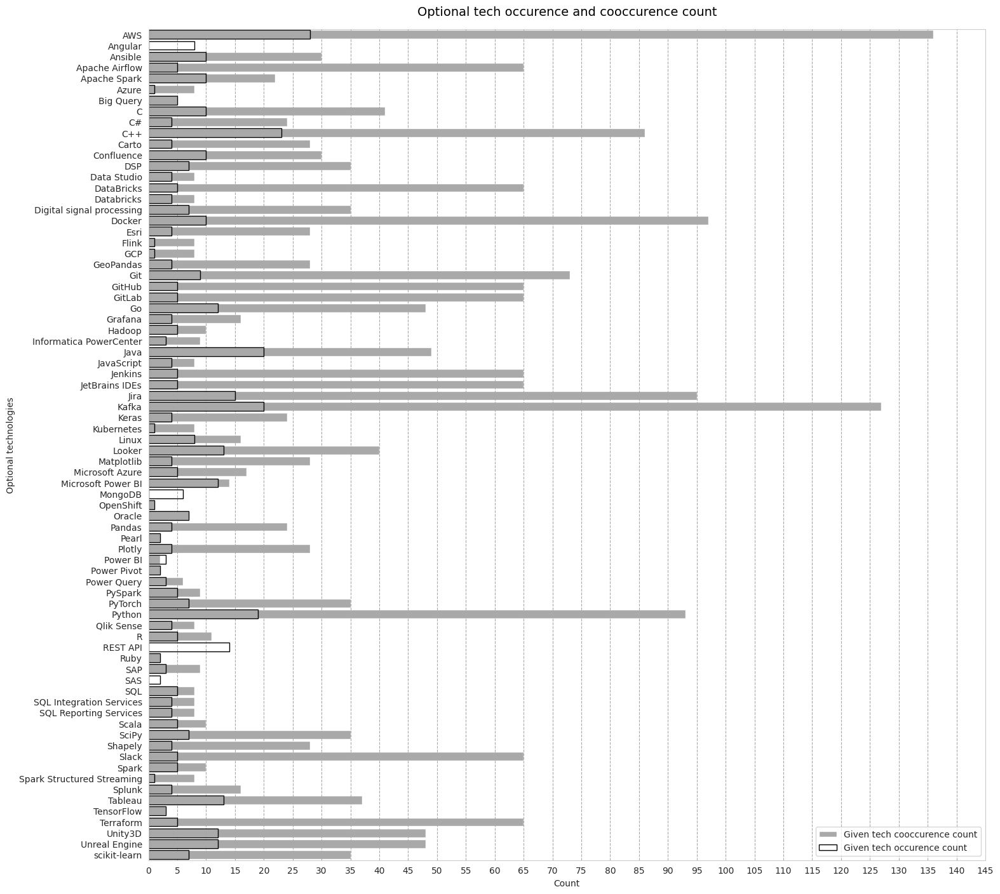

In [ ]:
sns.set_style("whitegrid", rc = custom)

fig, axs = plt.subplots(figsize=(17, 17))
sns.barplot(x = optional_tech_cooc_S, y = optional_tech_cooc_S.index, ax=axs,facecolor='darkgrey', zorder=0, label='Given tech cooccurence count')
sns.barplot(x = optional_tech_occ_S, y = optional_tech_occ_S.index, ax=axs, facecolor='none', edgecolor='black', linewidth=1, zorder=1, label='Given tech occurence count')
plt.title('Optional tech occurence and cooccurence count', fontdict=title_font_dct, y=1.01)
plt.xticks(np.arange(0, 150, 5))
plt.xlabel('Count')
plt.ylabel('Optional technologies')
plt.show()

### 5.2.4. Create cooccurence graph

In [ ]:
# Initialize a NetworkX graph
G = nx.Graph()

# Add edges to the graph
for pair, count in number_of_cooocs_optional.items():
    tech1, tech2 = pair
    G.add_edge(tech1, tech2, weight=count)

# Set node sizes based on co-occurrence counts
node_sizes = np.array([optional_tech_cooc_dct[tech] for tech in  G.nodes()])

# Set edge weights
edge_widths = np.array([count for _, _, count in G.edges(data='weight')])

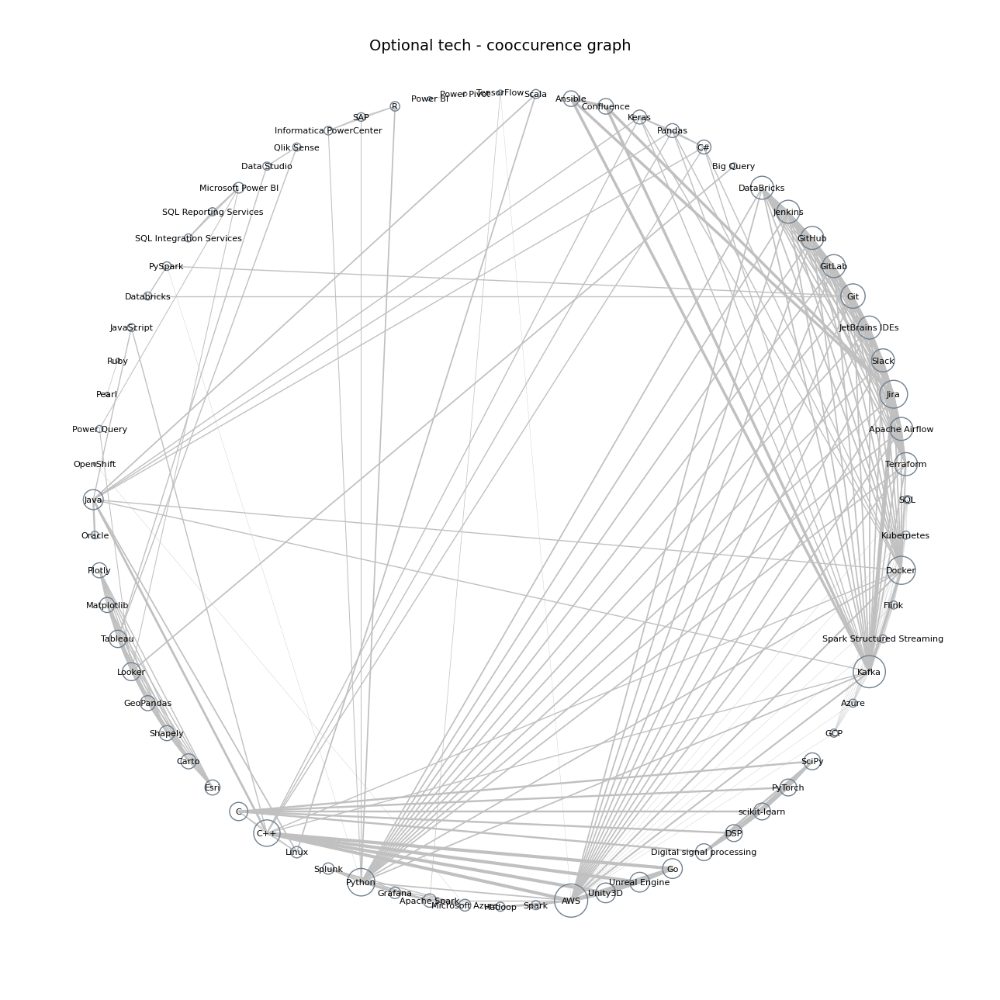

In [ ]:
# Plot the graph showing coocurence power
sns.set_style("whitegrid", rc = custom)

fig, ax = plt.subplots(figsize=(13, 13))
pos = nx.shell_layout(G)  # Define the layout of the nodes
nx.draw(G, pos, with_labels=True, node_size=node_sizes*7, width=edge_widths/4, node_color='none', edge_color='silver', edgecolors='slategrey', font_size=8)
edge_labels = nx.get_edge_attributes(G, 'weight')
ax.set_aspect('equal')
plt.tight_layout()
plt.title('Optional tech - cooccurence graph', y=0.95, fontdict=title_font_dct)
plt.show()

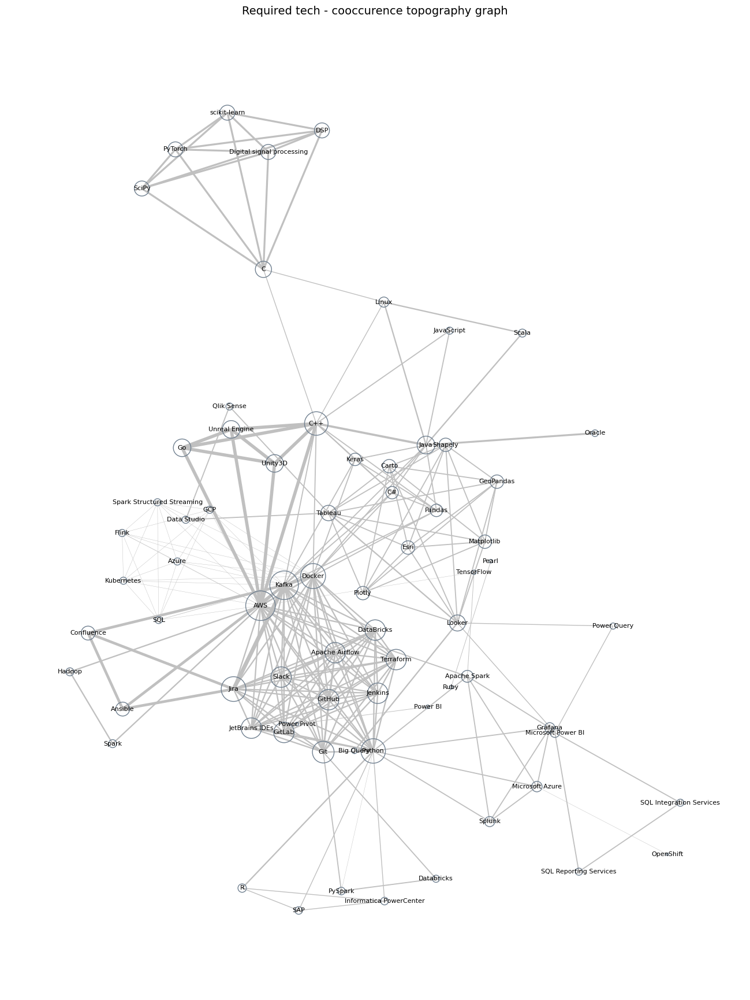

In [ ]:
# Plot the graph showing coocurence power
sns.set_style("whitegrid", rc = custom)

fig, ax = plt.subplots(figsize=(17, 17))
pos = nx.kamada_kawai_layout(G, weight=.001)  # Define the layout of the nodes
nx.draw(G, pos, with_labels=True, node_size=node_sizes*10, width=edge_widths/3, node_color='none', edge_color='silver', edgecolors='slategrey', font_size=8)
edge_labels = nx.get_edge_attributes(G, 'weight')
ax.set_aspect('equal')
plt.tight_layout()
plt.title('Required tech - cooccurence topography graph', y=1.01, fontdict=title_font_dct)
plt.show()

### 5.3. Analyze optional vs required tech coocurence

In [ ]:
# Filter out rows w
req_vs_optional_df = working_df[working_df['section-technologies-optional'].apply(lambda x: len(x) != 0)]

In [ ]:
req_vs_opt_list_of_coocc_tuples = []
# Count the number of occurences
for opt, req in zip(req_vs_optional_df['section-technologies-optional'], req_vs_optional_df['section-technologies-required']):
  combinations = [(x, y) for x in opt for y in req]
  # We do not order the tuples with set() - we want to save information about what is optional and what is required
  req_vs_opt_list_of_coocc_tuples += combinations

In [ ]:
# Count the number of cooscurences
req_vs_opt_number_of_cooocs = Counter(req_vs_opt_list_of_coocc_tuples)

### 5.3.1. Create cooccurence matrix

In [ ]:
# Create blank cooccurence matrix
req_vs_opt_coocc_matrix = pd.DataFrame(
    index=tech_index_opt, columns=tech_index_req,
    data=np.zeros(
        shape=(len(tech_index_opt), len(tech_index_req)),
        dtype=np.int_)
)

In [ ]:
for key, value in req_vs_opt_number_of_cooocs.items():
  req_vs_opt_coocc_matrix.loc[key[0], key[1]] += int(value)

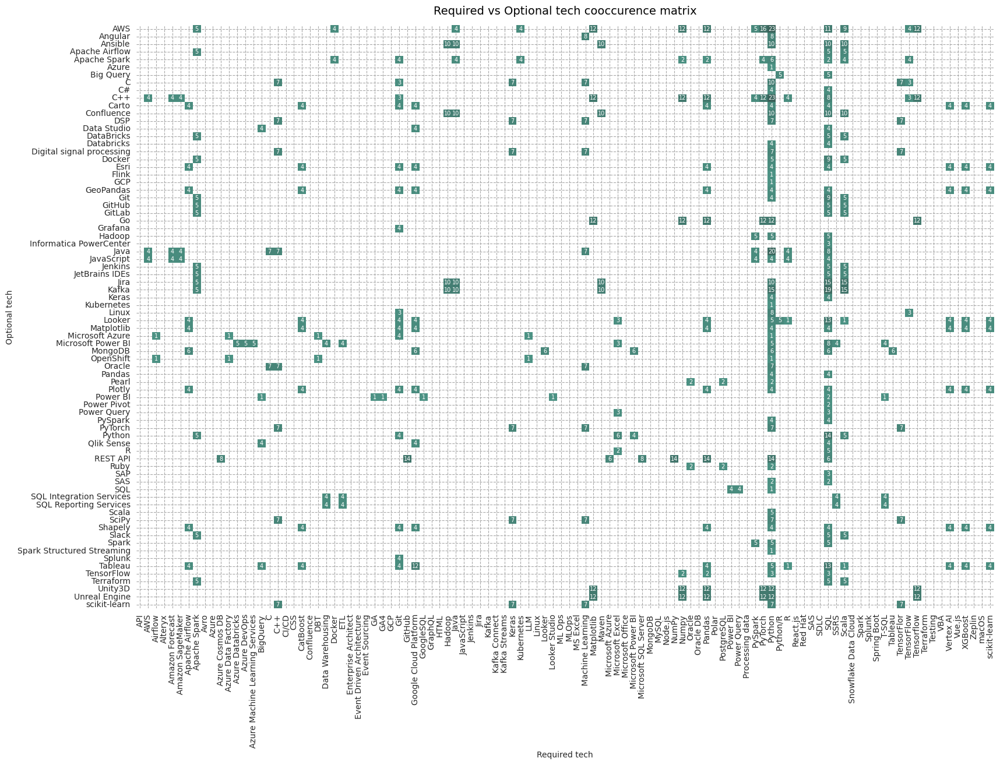

In [ ]:
sns.set_style("whitegrid", rc = custom)
# Let's mask zeros
mask_coocc_req_vs_opt = np.array(~(req_vs_opt_coocc_matrix[req_vs_opt_coocc_matrix == 0].astype(bool)))

fig, axs = plt.subplots(figsize=(19, 13))

sns.heatmap(
    req_vs_opt_coocc_matrix,
    cmap=dark_green,
    annot=True,
    ax=axs,
    mask=mask_coocc_req_vs_opt,
    vmin=-10,
    vmax=50,
    xticklabels=True,
    yticklabels=True,
    cbar=False,
    annot_kws=dict(size=7)
)
axs.set_xlabel('Required tech')
axs.set_ylabel('Optional tech')
plt.title('Required vs Optional tech cooccurence matrix', fontdict=title_font_dct, y=1.01)
plt.show()

### 5.3.2. Create cooccurence graph

<ipython-input-66-099b289e0c64>:41: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


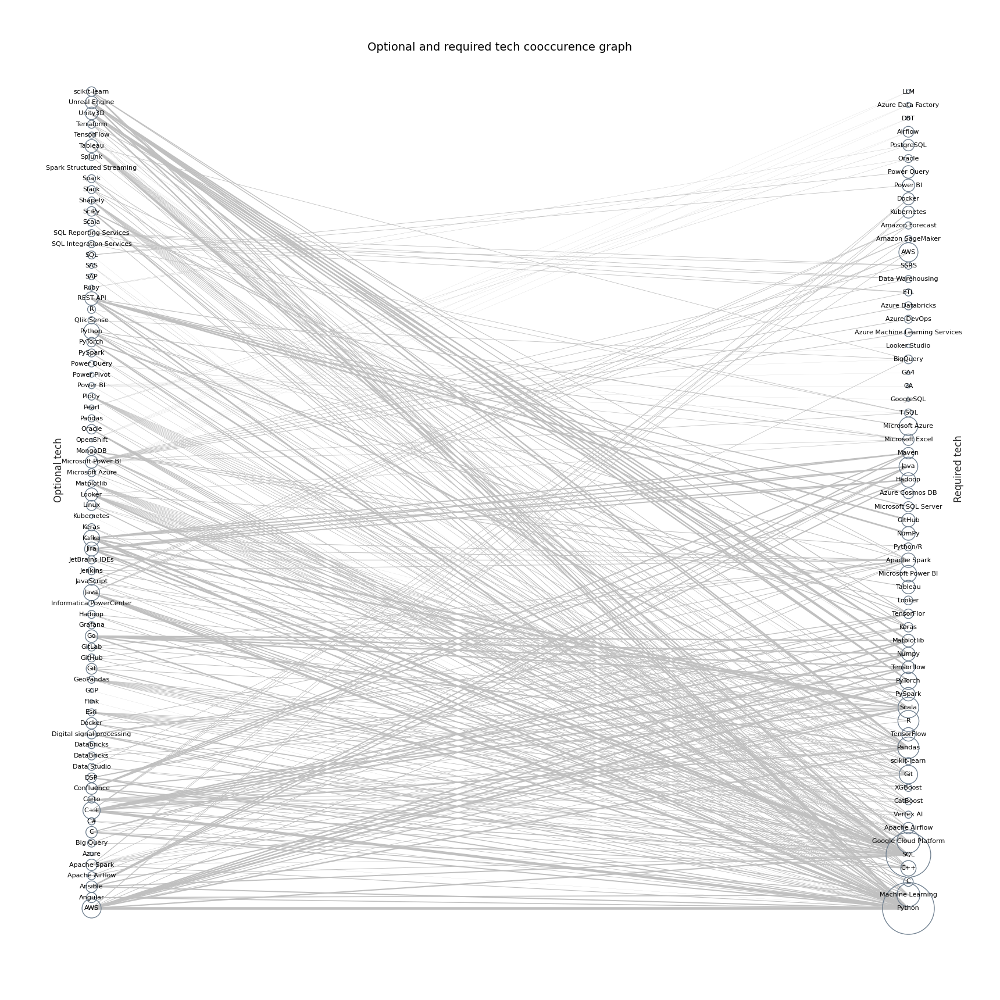

In [ ]:
# Create a directed graph
G = nx.Graph()

for (tech_opt, tech_req), count in req_vs_opt_number_of_cooocs.items():
  # Get the tech occurence for node sizes
  tech_opt_count = optional_tech_occ_S.loc[tech_opt]
  tech_req_count = required_tech_occ_S.loc[tech_req]

  # Make node names unique between optional and required
  tech_opt += '_opt'
  tech_req += '_req'
  G.add_edge(tech_opt, tech_req, weight=count)

  # Set node attributes
  nx.set_node_attributes(G, {tech_opt:tech_opt_count}, 'weight')
  nx.set_node_attributes(G, {tech_req:tech_req_count}, 'weight')


optional_for_graph = [x + '_opt' for x in tech_index_opt]
required_for_graph = [x + '_req' for x in tech_index_req]

# Setup bipartite layout
pos = nx.bipartite_layout(G, optional_for_graph)

# Get edge weights
edge_weights = nx.get_edge_attributes(G, 'weight')

# Get node weights
node_weights = nx.get_node_attributes(G, 'weight')

# Create a mapping between original node names and stripped labels
label_mapping = {node: node.replace('_opt', '').replace('_req', '') for node in G.nodes}

# Draw the graph
plt.figure(figsize=(17, 17))
nx.draw(G, pos, with_labels=True, labels=label_mapping, node_size=[node_weights[node]*20 for node in G.nodes], width=[edge_weights[edge]/7 for edge in G.edges], node_color='none', edge_color='silver', edgecolors='slategrey', font_size=8)

plt.title('Optional and required tech cooccurence graph', fontdict=title_font_dct, y=0.95)
plt.text(s='Optional tech', x=-0.9, y=0.0, rotation=90, fontdict={'size': 12})
plt.text(s='Required tech', x=1.1, y=0.0, rotation=90, fontdict={'size': 12})
plt.tight_layout()
plt.show()

## 6. Job title

Here we will categorize job offers according to professional specialty.

1. Firstly, we will strip job titles of irrelevant information.
2. Secondly, we will use KMeans clustering to group information obtained in (1).
3. Lastly, we wil name clusters / groups of clusters to create a job_cat column in the dataset.

In [ ]:
working_df.title[65].split(',')

['Praca Data Scientist',
 ' Zone IT Sp. z o.o.',
 ' Wrocław',
 ' Wagonowa 2d - theprotocol.it']

In [ ]:
# Define the function to clean job titles
def clean_job_titles(text):
  parts = text.split(',')
  title_words = parts[0].split()
  title_words = [word for word in title_words if word.lower() not in ['job', 'praca']]
  cleaned_title = ' '.join(title_words)

  return cleaned_title

In [ ]:
# Retrieve position names from site titles
working_df['position_name'] = working_df['title'].apply(clean_job_titles)

In [ ]:
working_df['position_name'].value_counts()

Data Scientist                                                          85
Data Analyst                                                            21
Machine Learning Engineer                                               14
Senior Data Scientist                                                   13
Senior Machine Learning Engineer                                        11
Machine Learning Engineering Leader                                      7
Machine Learning Developer                                               7
Machine Learning Engineer (Generative AI)                                7
Senior Big Data Developer                                                6
Software Development Manager (Machine Learning Software Engineering)     6
NLP Data Science specialist                                              6
Senior Data Engineer - Machine Learning Research                         6
Senior Software Engineer (Machine Learning - MLOps)                      6
Middle Big Data Engineer 

---

Well, we were hoping for few categories that will help us perform further analysis (depending on position name as category), but apparently HR departments are rather creative in namming positions. We need to do some additional categorization. Looking at value counts above, we could probably come up with some rule-based method. Let's forget for a moment that our dataset has under 200 rows and try something more sophisticated: we will try clustering position names, and then - hopefully - we will name the clusters.

---

In [ ]:
# Perform KMeans clustering
vectorizer = TfidfVectorizer()
X = vectorizer.fit_transform(working_df['position_name'].values)
kmeans = KMeans(n_clusters=6, random_state=SEED)
kmeans.fit(X)

cluster_labels = kmeans.labels_

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


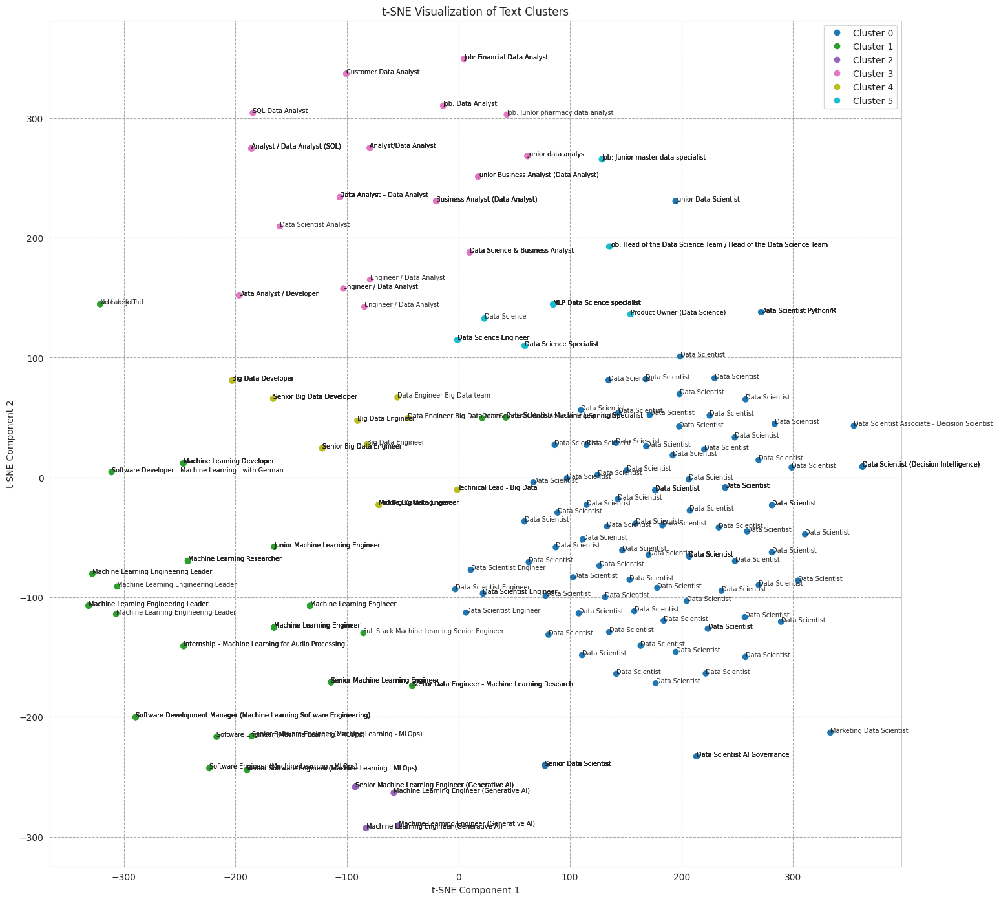

In [ ]:
# Reduce dimensionality using t-SNE
tsne = TSNE(n_components=2, random_state=42)
X_tsne = tsne.fit_transform(X.toarray())

# Plot the points colored by cluster labels
plt.figure(figsize=(17, 17))

scatter = plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=cluster_labels, cmap='tab10', label=cluster_labels)

# Add labels for each point
for i, txt in enumerate(working_df['position_name'].values):
    plt.annotate(txt, (X_tsne[i, 0], X_tsne[i, 1]), fontsize=7)

plt.title('t-SNE Visualization of Text Clusters')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.legend(handles=scatter.legend_elements()[0], labels=[f'Cluster {digit}' for digit in np.unique(cluster_labels)])
plt.show()

Our KMeans clustering turned out rather well. Let's append labels to our working_df.

In [ ]:
working_df['SixMeans_labales'] = cluster_labels

And name the clusters. We dissolve some clusters into same job category on the basis of visual interpretation of above t_SNE plot.

In [ ]:
cluster_names_dct = {
    0: 'Data Scientist',
    1: 'Machine Learning Engineer',
    2: 'Machine Learning Engineer',
    3: 'Data Analyst',
    4: 'Big Data Engineer',
    5: 'Data Scientist',
}

In [ ]:
# Create a column with job categories
working_df['job_cats'] = working_df['SixMeans_labales'].replace(cluster_names_dct)

In [ ]:
working_df[['position_name', 'job_cats']]

,position_name,job_cats
0,Data Scientist,Data Scientist
1,Data Scientist AI Governance,Data Scientist
2,Machine Learning Engineer,Machine Learning Engineer
3,Data Scientist,Data Scientist
4,Internship – Machine Learning for Audio Proces...,Machine Learning Engineer
...,...,...
334,Job: Financial Data Analyst,Data Analyst
335,Business Analyst (Data Analyst),Data Analyst
336,Data Science,Data Scientist
337,Job: Junior master data specialist,Data Scientist


## 7. Requirements - paragraph text mining and analysis


Analysing the `'section-requirements'` column we will

1. Use scattertext with categories created above to analyse how certain words in paragraph text fit to each category.
1. Check how traditional models offered by gensim API deal with topic modelling for section-requirements data.
2. We will adjust our method on the basis of (1.)

But before that let's create word embeddings using spaCy

### 7.1. Create embeddings using spaCy

In [ ]:
# Download NLTK resources (uncomment the following line if needed)
nltk.download('punkt')
nltk.download('stopwords')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [ ]:
# Define stopwords
stop_words = set(stopwords.words('english'))

In [ ]:
# Define spaCy pipeline object
nl_processor = spacy.load("en_core_web_md")

In [ ]:
# Crate function
def create_spacy_embeddings(text, pipeline):
  embedding = pipeline(text)
  return embedding

In [ ]:
# Use spacy pipeline to create documents with word embeddings
working_df['section-requirements-spaCy_docs'] = working_df['section-requirements'].apply(func=create_spacy_embeddings, pipeline=nl_processor)

### 7.2. Perform analysis using scattertext

In [ ]:
# Create scattertext corpus
corpus = scattertext.CorpusFromPandas(
    working_df,
    text_col='section-requirements',
    category_col='job_cats',
    nlp=nl_processor
).build().remove_terms(stop_words, ignore_absences=True)

In [ ]:
# Check the count of terms in the corpus
term_count_df = corpus.get_term_count_df()

In [ ]:
term_count_df.sort_values('corpus', ascending=False).head(23)

,corpus
term,
experience,1095
data,920
knowledge,888
knowledge of,776
experience in,554
skills,371
/,350
learning,339
ability,307


In [ ]:
# Check how many ngrams has been extracted by scatterplot
two_plus_grams = [x for x in term_count_df.index if len(x.split()) >1]

In [ ]:
term_count_df.loc[two_plus_grams].sort_values('corpus', ascending=False).head(31)

,corpus
term,
knowledge of,776
experience in,554
ability to,304
machine learning,284
experience with,197
years of,184
our requirements,172
in the,171
our expectations,163


In [ ]:
# Check the count frequency per category
term_freq_df = corpus.get_term_freq_df()

In [ ]:
term_freq_df.head()

,Data Scientist freq,Machine Learning Engineer freq,Big Data Engineer freq,Data Analyst freq
term,,,,
requirements,71,82,21,14
master,14,15,0,3
's,12,7,0,14
degree,26,41,0,6
quantitative,38,3,0,0


In [ ]:
# Check most popular terms per job cat
scattertext_sorted_terms = {}
for column in term_freq_df.columns:
  scattertext_sorted_terms[column] = term_freq_df[column].sort_values(ascending=False).index

pd.DataFrame(scattertext_sorted_terms).head(31)

,Data Scientist freq,Machine Learning Engineer freq,Big Data Engineer freq,Data Analyst freq
0,experience,experience,knowledge,knowledge
1,data,experience in,knowledge of,knowledge of
2,knowledge,data,data,data
3,knowledge of,knowledge,experience,experience
4,experience in,learning,experience in,ability
5,skills,knowledge of,/,ability to
6,learning,machine learning,platform,sql
7,/,machine,of the,experience in
8,science,skills,practical,expectations
9,machine learning,science,spark,our expectations


### 7.3. Produce scattertext explorers

### 7.2.1. Data Scientist scattertext analysis

In [ ]:
html = scattertext.produce_scattertext_explorer(
    corpus,
    category='Data Scientist',
    category_name='Data Scientist jobs',
    not_category_name='Other jobs',
    width_in_pixels=1200,
    use_full_doc=True
)
# Save the HTML object to a file
filename = 'scattertext_visualization.html'
with open(filename, 'w') as f:
    f.write(html)

# Display the HTML file in the notebook using an iframe
IPython.display.HTML(filename='/content/scattertext_visualization.html')

### 7.2.2. Machine Learning Engineer scattertext analysis

In [ ]:
html = scattertext.produce_scattertext_explorer(
    corpus,
    category='Machine Learning Engineer',
    category_name='ML Engineer jobs',
    not_category_name='Other jobs',
    width_in_pixels=1200,
    use_full_doc=True
)
# Save the HTML object to a file
filename = 'scattertext_visualization.html'
with open(filename, 'w') as f:
    f.write(html)

# Display the HTML file in the notebook using an iframe
IPython.display.HTML(filename='/content/scattertext_visualization.html')

### 7.3. Topic modelling

We will try to captchure significant diffrerences between job requirement descriptions. Reasonable assumption is: differences in topic distribution should reflect diffreneces in job categories (since different skills should be required from Big Data Engineer and Data Analyst). We can assume that it's true for tech skills, but will it apply to non-tech skills?

We will use gensim models for topic modeling:

1. Latent Semantic Indexing,
2. Hierarchical Drichlet Process
3. Latent Drichlet Allocation
4. Non-Negative Matrix factorization (NNMF)

### 7.3.1. Create gensim corpus

In [ ]:
import gensim
from gensim.corpora import Dictionary
from gensim.models import LdaModel, CoherenceModel, LsiModel, HdpModel, Nmf

In [ ]:
gensim.models.coherencemodel.CoherenceModel

gensim.models.coherencemodel.CoherenceModel

In [ ]:
plain_docs, texts, article = [], [], []

# Parse through spaCy docs and remove trash
for it, doc in enumerate(working_df['section-requirements-spaCy_docs'].values):
  for word in doc:
    if word.text != '\n' and not (word.is_stop or word.is_punct or word.is_left_punct or word.is_right_punct or word.like_num or word.text == 'I'):
      article.append(word.lemma_.lower())
    if word.text == '\n':
      texts.append(article)
      article = []
  plain_docs.append(texts)
  texts = []

In [ ]:
len(plain_docs), len(working_df['section-requirements-spaCy_docs'].values)

(339, 339)

In [ ]:
for_gensim_ = []
for x in plain_docs:
  temp = []
  for y in x:
    temp.extend(y)

  for_gensim_.append(temp)

In [ ]:
# Create gensim dictionoray
gensim_dictionary = Dictionary(for_gensim_)

# Create a gensim corpus
gensim_corpus = [gensim_dictionary.doc2bow(doc) for doc in for_gensim_]

In [ ]:
len(gensim_corpus) == len(working_df['section-requirements-spaCy_docs'])

True

### 7.3.2. Latent Semantic Indexing




#### 7.3.2.1. Build the model, check the topics

In [ ]:
lsi_model = LsiModel(
    corpus=gensim_corpus,
    num_topics=7,
    id2word=gensim_dictionary
)

In [ ]:
lsi_model.show_topics()

[(0,
  '0.522*"experience" + 0.417*"knowledge" + 0.252*"datum" + 0.208*"data" + 0.173*"skill" + 0.140*"learning" + 0.139*"science" + 0.136*"work" + 0.129*"machine" + 0.127*"ability"'),
 (1,
  '0.646*"knowledge" + -0.264*"experience" + -0.173*"skill" + -0.152*"software" + -0.137*"model" + -0.136*"understanding" + -0.126*"science" + 0.122*"datum" + 0.114*"expectation" + -0.110*"requirement"'),
 (2,
  '0.404*"model" + -0.353*"experience" + 0.332*"datum" + 0.257*"nlp" + 0.182*"include" + 0.169*"skill" + -0.155*"e.g." + 0.153*"ability" + -0.136*"ml" + 0.115*"analysis"'),
 (3,
  '-0.359*"learning" + -0.313*"machine" + 0.223*"data" + -0.181*"computer" + 0.178*"ability" + -0.176*"ml" + 0.174*"work" + -0.156*"science" + 0.133*"software" + 0.126*"technical"'),
 (4,
  '0.390*"skill" + -0.298*"nlp" + 0.214*"science" + -0.187*"model" + -0.185*"experience" + 0.169*"\n " + 0.155*"communication" + -0.153*"processing" + -0.145*"etc" + 0.129*"data"'),
 (5,
  '0.355*"data" + 0.308*"datum" + -0.265*"work"

In [ ]:
lsi_u_df = pd.DataFrame(data=lsi_model.projection.u)

#### 7.3.2.2. Compare most frequent terms per topic

In [ ]:
most_frequent_terms_dct = {}
for topic_column in lsi_u_df.columns:
  terms = (lsi_u_df.sort_values(by=topic_column, ascending=False, key=abs).index).to_numpy().astype(np.int_)[:17]
  most_frequent_terms_dct[topic_column] = terms

pd.DataFrame(most_frequent_terms_dct).replace(dict(gensim_dictionary.items()))

,0,1,2,3,4,5,6
0,experience,knowledge,model,learning,skill,data,datum
1,knowledge,experience,experience,machine,nlp,datum,knowledge
2,datum,skill,datum,data,science,work,ability
3,data,software,nlp,computer,model,etc,analytical
4,skill,model,include,ability,experience,knowledge,data
5,learning,understanding,skill,ml,\n,platform,model
6,science,science,e.g.,work,communication,learning,include
7,work,datum,ability,science,processing,machine,sql
8,machine,expectation,ml,software,etc,processing,agile
9,ability,requirement,analysis,technical,data,tool,expectation


---

LDI topic modelling result is not satisfying. There reason is: job offer lexicon often consists of words that stress the importance of competences, but does not describe them (eg. knowledge, skill, understanding, strong etc.).

This basically means each text in requirement section speaks: "We need competent people".

Our text mining is not very revealing.

We should probably perform analysis on n-grams with such words. For know we will browse through other topic modelling methods, to check how they deal with reality described above.

---

Just to be systemic in our research let's visualize the distribution of topics between job categories.

---

#### 7.3.2.3. Visualize topic vs job_cats distribution

In [ ]:
lsi_vectors_generator = lsi_model[gensim_corpus]

In [ ]:
lsi_vectors = [x for x in lsi_vectors_generator]

In [ ]:
lsi_vectors_df = pd.DataFrame(lsi_vectors)

In [ ]:
lsi_vectors_df

,0,1,2,3,4,5,6
0,"(0, 6.692598246209736)","(1, -3.04144989739191)","(2, 1.077614492660241)","(3, 1.0221890146303527)","(4, -0.3984024817844503)","(5, 3.4686679558404134)","(6, -1.776526701471974)"
1,"(0, 5.800470072298972)","(1, -1.7984861632374132)","(2, -0.5789513898852737)","(3, 1.8121985839283516)","(4, -0.8708129021385906)","(5, 0.9841404301811512)","(6, -2.1790870280426344)"
2,"(0, 1.179324073953468)","(1, -0.636210181207151)","(2, -0.452373376343763)","(3, -0.07929140752255037)","(4, 0.47419479914626445)","(5, -0.06586668675790866)","(6, -0.026383480260595067)"
3,"(0, 7.48024172896068)","(1, -3.7944304306327967)","(2, 1.4400610582770779)","(3, 0.8309264179990317)","(4, 4.206824220137063)","(5, 0.927486901278313)","(6, -2.49128912189761)"
4,"(0, 3.8879363201259993)","(1, 1.7481732577631501)","(2, 0.4019660121388116)","(3, -1.7772660751960971)","(4, 1.0732438575646706)","(5, -0.43755762394345377)","(6, 0.9325151003278211)"
...,...,...,...,...,...,...,...
334,"(0, 4.336932944457353)","(1, 3.456134544458983)","(2, 0.2430682591300503)","(3, 0.9282136756261233)","(4, 0.16681098301674455)","(5, -0.7041370553328604)","(6, -1.0422994246151398)"
335,"(0, 3.538341495774539)","(1, 2.3851777289584972)","(2, 0.07090853115194976)","(3, 0.9424983390001496)","(4, 0.2904278921941252)","(5, -1.0677025626505303)","(6, -1.768683520347447)"
336,"(0, 4.849563641220848)","(1, 1.0253479387160538)","(2, 1.1080743945774625)","(3, 0.04459604843897806)","(4, 0.1269043076000107)","(5, -1.4071821975369716)","(6, -1.3412295367969498)"
337,"(0, 6.189178422113947)","(1, 3.7509748233219247)","(2, 0.9415926869915924)","(3, 2.7403718664940464)","(4, 0.38841609586126613)","(5, -0.23162232873408667)","(6, -1.5183068856747546)"


In [ ]:
lsi_vectors_df = lsi_vectors_df.applymap(lambda x: x[1] if x is not None else None)

In [ ]:
lsi_vectors_df

,0,1,2,3,4,5,6
0,6.692598,-3.041450,1.077614,1.022189,-0.398402,3.468668,-1.776527
1,5.800470,-1.798486,-0.578951,1.812199,-0.870813,0.984140,-2.179087
2,1.179324,-0.636210,-0.452373,-0.079291,0.474195,-0.065867,-0.026383
3,7.480242,-3.794430,1.440061,0.830926,4.206824,0.927487,-2.491289
4,3.887936,1.748173,0.401966,-1.777266,1.073244,-0.437558,0.932515
...,...,...,...,...,...,...,...
334,4.336933,3.456135,0.243068,0.928214,0.166811,-0.704137,-1.042299
335,3.538341,2.385178,0.070909,0.942498,0.290428,-1.067703,-1.768684
336,4.849564,1.025348,1.108074,0.044596,0.126904,-1.407182,-1.341230
337,6.189178,3.750975,0.941593,2.740372,0.388416,-0.231622,-1.518307


In [ ]:
# Group lsi vectors by job category and aggregate mean vector values
lsi_words_vectors_grouped_df = lsi_vectors_df.groupby(working_df['job_cats']).mean()
lsi_words_vectors_grouped_df

,0,1,2,3,4,5,6
job_cats,,,,,,,
Big Data Engineer,6.795973,3.063343,-1.260013,1.191255,-0.315267,1.203692,1.793012
Data Analyst,5.034427,2.289681,0.434092,1.046225,0.438899,-0.110861,-1.021779
Data Scientist,6.701061,-0.274656,0.947963,-0.457835,0.216371,-0.397913,-0.895266
Machine Learning Engineer,6.405599,-2.155567,-1.302654,-0.624460,-0.211789,-0.239861,0.405136


<Axes: ylabel='job_cats'>

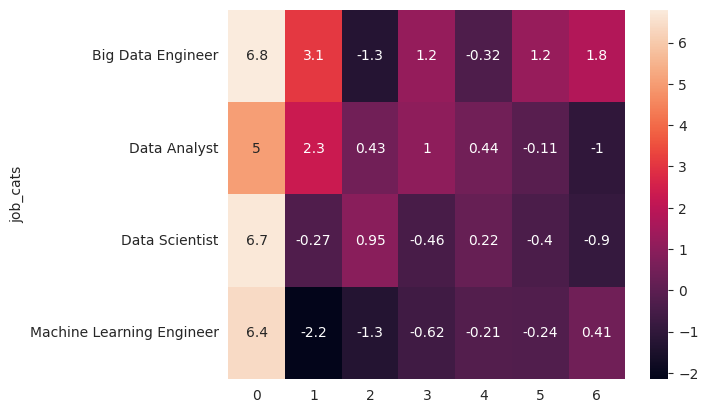

In [ ]:
sns.heatmap(
    lsi_words_vectors_grouped_df,
    annot=True
)

In [ ]:
lsi_model.projection.s

array([127.740398  ,  56.98701522,  44.55176991,  41.95940398,
        36.78766795,  36.39476218,  33.40229243])

---

Model's inconsequentiality is best visualized by overwhelming domination of topic "0" as a shown in `lsi_model.projection.s`

---

#### 7.3.2.4. Build coherence model for LSI

In [ ]:
# Create a coherence model with your trained LSI model, corpus, and dictionary
coherence_model_lsi = gensim.models.coherencemodel.CoherenceModel(model=lsi_model,
                                  texts=working_df['section-requirements'].to_list(),
                                  corpus=gensim_corpus,
                                  dictionary=gensim_dictionary,
                                  window_size=7,
                                  topn=3,
                                  coherence='c_v')  # You can choose the coherence measure you want to use

# Calculate the coherence score
with np.errstate(invalid='ignore'):
  coherence_score_lsi = coherence_model_lsi.get_coherence()

print("Coherence Score:", coherence_score_lsi)

Coherence Score: nan


/usr/local/lib/python3.10/dist-packages/gensim/topic_coherence/direct_confirmation_measure.py:204: RuntimeWarning: divide by zero encountered in scalar divide
  m_lr_i = np.log(numerator / denominator)


In [ ]:
pd.DataFrame(coherence_model_lsi.top_topics_as_word_lists(
    model=lsi_model,
    dictionary=gensim_dictionary)).T

,0,1,2,3,4,5,6
0,experience,knowledge,model,data,skill,data,knowledge
1,knowledge,datum,datum,ability,science,datum,data
2,datum,expectation,nlp,work,\n,etc,model
3,data,welcome,include,software,communication,platform,include
4,skill,tool,skill,technical,data,processing,agile
5,learning,sql,ability,tooling,good,tool,practical
6,science,platform,analysis,platform,computer,requirement,big
7,work,process,statistical,business,business,cloud,software
8,machine,education,programming,problem,cloud,\n,advanced
9,ability,practical,high,lifecycle,analytical,ai,system


In [ ]:
coherence_model_lsi.topics

[array([ 32, 133,  19]),
 array([133,  19, 962]),
 array([ 55,  19, 565]),
 array([ 17,   1, 169]),
 array([ 76,  74, 902]),
 array([17, 19, 31]),
 array([133,  17,  55])]

### 7.3.3. Hierarchical Drichlet Process

#### 7.3.3.1. Build the model, check the topics

In [ ]:
hdp_model = HdpModel(
    corpus=gensim_corpus,
    T=7,
    id2word=gensim_dictionary
)

In [ ]:
hdp_model.show_topics()

[(0,
  '0.005*analytic + 0.005*stay + 0.005*scalability + 0.005*bigquery + 0.004*ml + 0.004*ssis + 0.004*accurately + 0.004*sectional + 0.004*package + 0.004*medium + 0.004*services + 0.004*advisory + 0.003*pytorch + 0.003*nonetype + 0.003*computational + 0.003*opportunity + 0.003*provide + 0.003*pandas + 0.003*panda + 0.003*evidence'),
 (1,
  '0.005*•exceptional + 0.005*toolset + 0.005*intuitive + 0.005*training + 0.005*2d + 0.004*start + 0.004*torch + 0.004*team + 0.004*necessary + 0.004*essential + 0.004*great + 0.004*zone + 0.004*biomedical + 0.004*informatic + 0.004*type + 0.004*reproducibility + 0.004*translate + 0.004*library + 0.004*containerisation + 0.004*shiny'),
 (2,
  '0.007*cooperate + 0.006*validation + 0.005*pragmatic + 0.005*confirm + 0.005*aw + 0.004*avro + 0.004*resilient + 0.004*san + 0.004*advantage + 0.004*user + 0.004*multiple + 0.004*mandatory + 0.004*pattern + 0.003*mathematics + 0.003*employer + 0.003*hive + 0.003*training + 0.003*architect + 0.003*boot + 0.00

---

HDP clustering seems to be a little more fruitfull. The model has successfully abstracted meaningful terms and topics differ from each other significantly.

---

#### 7.3.3.2. Visualize topic vs job_cats distribution

In [ ]:
# Check
hdp_inferred_topics = [hdp_model.inference(chunk=[single_document]) for single_document in gensim_corpus ]
hdp_topics_df = pd.DataFrame(np.array(hdp_inferred_topics).squeeze())
print(hdp_topics_df)

             0          1          2          3          4          5  \
0    35.508637  21.687765   0.092884  14.917739   0.109967  35.558090   
1     0.110734   0.317663  35.583445  16.782301  16.325025  48.836227   
2     0.110713   9.450122   0.092879   0.087647   0.109950   0.310674   
3    42.306233  37.448425   0.092884  10.941904   0.109987  33.055962   
4    13.202829  29.075479   9.186817   0.087648   5.092392   0.310230   
..         ...        ...        ...        ...        ...        ...   
334   0.110719   9.856197   0.092882   0.087647   0.109970  38.697981   
335   0.110713  13.067534   0.092884  11.770214   0.109983  33.804067   
336   0.110737  33.500437   0.092884   0.087644  15.645134  13.518559   
337   0.110744  42.527372   0.092883   0.087646  16.738549  19.398201   
338   0.110719  66.122774  15.428509   0.087644   0.109986  38.095763   

            6  
0    8.124918  
1    0.044604  
2    2.838015  
3    0.044604  
4    0.044604  
..        ...  
334  0.0446

In [ ]:
hdp_words_vectors_grouped_df = hdp_topics_df.groupby(working_df['job_cats']).mean()
hdp_words_vectors_grouped_df

,0,1,2,3,4,5,6
job_cats,,,,,,,
Big Data Engineer,4.326062,24.527275,5.112611,4.102302,3.664444,31.317083,1.435937
Data Analyst,1.173999,19.120840,1.036429,1.993034,5.119615,31.684659,0.609885
Data Scientist,8.393475,26.231643,2.787538,5.587224,4.647575,33.407096,1.117862
Machine Learning Engineer,9.218253,17.189873,4.901750,5.102776,5.636300,42.409945,4.168762


<Axes: ylabel='job_cats'>

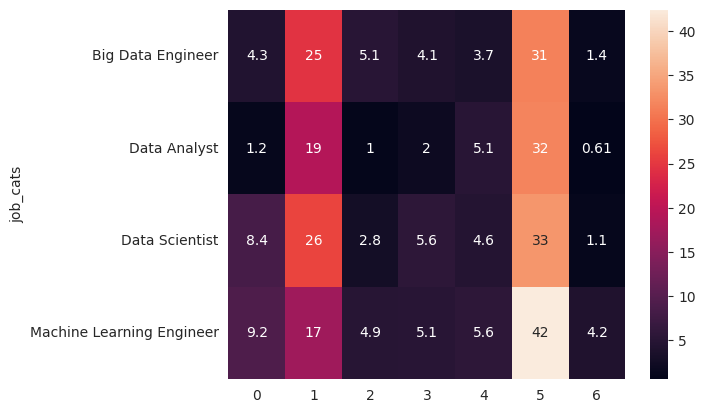

In [ ]:
sns.heatmap(
    hdp_words_vectors_grouped_df,
    annot = True
)

---

First glance at HDP topics was promising. It turns out that regardless of job category two of the topics are prevalent.

---

#### 7.3.3.3. Build coherence model for HDP, show topics as word lists

In [ ]:
# Create a coherence model with your trained LSI model, corpus, and dictionary
coherence_model_hdp = gensim.models.coherencemodel.CoherenceModel(model=hdp_model,
                                  texts=working_df['section-requirements'].to_list(),
                                  corpus=gensim_corpus,
                                  dictionary=gensim_dictionary,
                                  window_size=7,
                                  topn=3,
                                  coherence='c_v')  # You can choose the coherence measure you want to use

# Calculate the coherence score
with np.errstate(invalid='ignore'):
  coherence_score_hdp = coherence_model_hdp.get_coherence()

print("Coherence Score:", coherence_score_hdp)

Coherence Score: nan


/usr/local/lib/python3.10/dist-packages/gensim/topic_coherence/direct_confirmation_measure.py:204: RuntimeWarning: divide by zero encountered in scalar divide
  m_lr_i = np.log(numerator / denominator)


In [ ]:
pd.DataFrame(coherence_model_hdp.top_topics_as_word_lists(
    model=hdp_model,
    dictionary=gensim_dictionary)).T

,0,1,2,3,4,5,6
0,analytic,•exceptional,cooperate,index,b2,cooperation,enhance
1,stay,toolset,validation,econometrics,medium,tool,funnel
2,scalability,intuitive,pragmatic,discuss,diverse,software,market
3,bigquery,training,confirm,necessary,conflict,discipline,glue
4,ml,2d,aw,technique,solutions,teradata,ssis
5,ssis,start,avro,language,stem,select,mathematics
6,accurately,torch,resilient,conscientious,ranger,regression,reflect
7,sectional,team,san,management,packaging,possibility,initiative
8,package,necessary,advantage,typically,user,lead,emotion
9,medium,essential,user,fmcg,dialect,bank,start


### 7.3.4. Latent Drichlet Allocation

#### 7.3.4.1. Build the model, show topics

In [ ]:
lda_model = LdaModel(
    corpus=gensim_corpus,
    num_topics=7,
    id2word=gensim_dictionary,
    passes=13,
    iterations=71,
    random_state=SEED
)

In [ ]:
lda_model.show_topics()

[(0,
  '0.050*"knowledge" + 0.034*"experience" + 0.026*"datum" + 0.024*"skill" + 0.024*"ability" + 0.018*"analytical" + 0.016*"work" + 0.015*"welcome" + 0.015*"expectation" + 0.014*"sql"'),
 (1,
  '0.053*"knowledge" + 0.051*"experience" + 0.028*"learning" + 0.028*"machine" + 0.019*"datum" + 0.017*"work" + 0.014*"science" + 0.013*"python" + 0.013*"good" + 0.013*"azure"'),
 (2,
  '0.038*"experience" + 0.030*"knowledge" + 0.019*"data" + 0.018*"datum" + 0.015*"ability" + 0.015*"platform" + 0.012*"sql" + 0.009*"year" + 0.009*"requirement" + 0.009*"english"'),
 (3,
  '0.035*"science" + 0.030*"skill" + 0.028*"experience" + 0.027*"\n " + 0.024*"data" + 0.020*"datum" + 0.018*"communication" + 0.016*"scientist" + 0.014*"knowledge" + 0.014*"requirement"'),
 (4,
  '0.038*"experience" + 0.020*"datum" + 0.014*"model" + 0.013*"work" + 0.012*"data" + 0.012*"nlp" + 0.011*"team" + 0.011*"ability" + 0.010*"etc" + 0.009*"software"'),
 (5,
  '0.043*"experience" + 0.021*"data" + 0.021*"skill" + 0.016*"model

#### 7.3.4.2. Visualize topic vs job_cats distribution

In [ ]:
lda_words_topics_per_document = [lda_model.get_document_topics(x) for x in gensim_corpus]

In [ ]:
lda_words_topics_per_document[:3]

[[(4, 0.99258876)],
 [(2, 0.9927172)],
 [(0, 0.011041314),
  (1, 0.011030153),
  (2, 0.011027295),
  (3, 0.448876),
  (4, 0.0110304),
  (5, 0.0110159395),
  (6, 0.4959789)]]

In [ ]:
a_list_for_topic_lda_words_df = []
for document in lda_words_topics_per_document:
  document_dcts = {}
  for a_tuple in document:
    document_dcts[a_tuple[0]] = a_tuple[1]
  a_list_for_topic_lda_words_df.append(document_dcts)

In [ ]:
lda_words_topic_per_document_probabilities = pd.DataFrame(a_list_for_topic_lda_words_df, columns= np.arange(7)).fillna(0.0)

In [ ]:
lda_words_topic_per_document_probabilities.describe()

,0,1,2,3,4,5,6
count,339.000000,339.000000,339.000000,339.000000,339.000000,339.000000,339.000000
mean,0.246265,0.149044,0.185190,0.052790,0.123883,0.056171,0.175795
std,0.364096,0.303704,0.342274,0.184593,0.278594,0.207407,0.329644
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.438247,0.016922,0.187009,0.000000,0.012499,0.000000,0.185814
max,0.992714,0.992042,0.993385,0.992183,0.994826,0.997132,0.993482


In [ ]:
lda_words_probabilities_grouped_df = lda_words_topic_per_document_probabilities.groupby(working_df['job_cats']).mean()
lda_words_probabilities_grouped_df

,0,1,2,3,4,5,6
job_cats,,,,,,,
Big Data Engineer,0.121715,0.113615,0.286482,0.032382,0.056972,0.016291,0.358253
Data Analyst,0.423599,0.028031,0.426201,0.005223,0.027138,0.001693,0.074038
Data Scientist,0.301731,0.185877,0.079634,0.096184,0.124433,0.053334,0.149321
Machine Learning Engineer,0.084457,0.189098,0.143646,0.026343,0.214848,0.113066,0.219058


<Axes: ylabel='job_cats'>

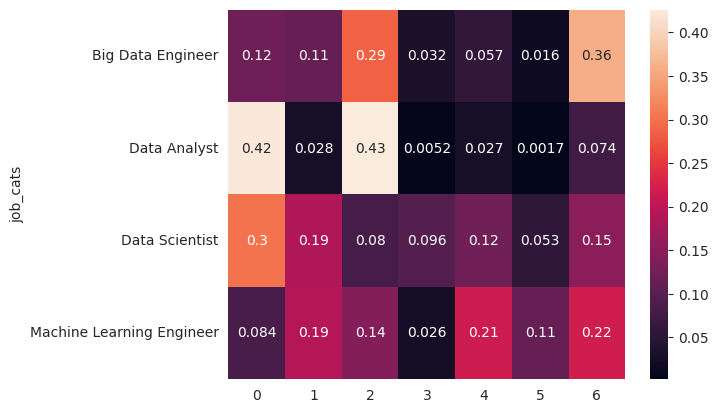

In [ ]:
sns.heatmap(
    lda_words_probabilities_grouped_df,
    annot=True
)

### 7.3.5. Non-Negative Matrix factorization

#### 7.3.5.1. Build the model, show topics

In [ ]:
nmf_model = Nmf(
    corpus=gensim_corpus,
    num_topics=7,
    id2word=gensim_dictionary,
    random_state=SEED
)

In [ ]:
nmf_model.show_topics()

[(0,
  '0.042*"experience" + 0.042*"data" + 0.017*"ability" + 0.016*"team" + 0.013*"work" + 0.013*"skill" + 0.012*"cloud" + 0.012*"management" + 0.012*"solution" + 0.011*"understanding"'),
 (1,
  '0.088*"knowledge" + 0.041*"datum" + 0.024*"ability" + 0.022*"tool" + 0.019*"expectation" + 0.018*"welcome" + 0.018*"sql" + 0.017*"platform" + 0.015*"experience" + 0.015*"english"'),
 (2,
  '0.063*"knowledge" + 0.050*"experience" + 0.031*"machine" + 0.025*"learning" + 0.018*"create" + 0.016*"year" + 0.014*"ml" + 0.012*"production" + 0.012*"sql" + 0.012*"etc"'),
 (3,
  '0.028*"experience" + 0.027*"skill" + 0.024*"data" + 0.023*"work" + 0.020*"good" + 0.018*"science" + 0.015*"knowledge" + 0.014*"analytical" + 0.014*"problem" + 0.013*"ability"'),
 (4,
  '0.032*"skill" + 0.031*"datum" + 0.029*"science" + 0.029*"model" + 0.022*"data" + 0.021*"computer" + 0.015*"programming" + 0.015*"include" + 0.013*"cloud" + 0.012*"\n "'),
 (5,
  '0.029*"experience" + 0.022*"datum" + 0.022*"knowledge" + 0.018*"mac

#### 7.3.5.2. Visualize topic vs job_cats distribution

In [ ]:
nmf_words_topics_per_document = [nmf_model.get_document_topics(x) for x in gensim_corpus]

In [ ]:
nmf_words_topics_per_document[:3]

[[(0, 0.16448968728507785),
  (1, 0.034138757615298554),
  (3, 0.04340428595373616),
  (4, 0.5617724577677422),
  (6, 0.19619481137814526)],
 [(0, 0.44859163453808504),
  (1, 0.09164866705150061),
  (2, 0.056731496182339),
  (3, 0.08537261585053459),
  (4, 0.020521945332595104),
  (6, 0.2971336410449456)],
 [(0, 0.22238804278603985),
  (2, 0.05631875035431554),
  (3, 0.22592775045974042),
  (4, 0.1353134612310169),
  (5, 0.04980195017037079),
  (6, 0.31025004499851644)]]

In [ ]:
a_list_for_topic_df = []
for document in nmf_words_topics_per_document:
  document_dcts = {}
  for a_tuple in document:
    document_dcts[a_tuple[0]] = a_tuple[1]
  a_list_for_topic_df.append(document_dcts)

In [ ]:
nmf_words_topic_per_document_probabilities = pd.DataFrame(a_list_for_topic_df, columns= np.arange(7)).fillna(0.0)

In [ ]:
nmf_words_topic_per_document_probabilities.describe()

,0,1,2,3,4,5,6
count,339.000000,339.000000,339.000000,339.000000,339.000000,339.000000,339.000000
mean,0.096280,0.180640,0.160905,0.135477,0.128141,0.121742,0.161409
std,0.139592,0.213437,0.176911,0.157619,0.151616,0.141377,0.183526
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.032787,0.088382,0.103935,0.078705,0.086016,0.050303,0.098302
75%,0.139327,0.320313,0.249838,0.204693,0.204911,0.239865,0.284132
max,0.612716,0.894910,0.759326,0.717667,0.644085,0.533337,0.819705


In [ ]:
nmf_words_probabilities_grouped_df = nmf_words_topic_per_document_probabilities.groupby(working_df['job_cats']).mean()
nmf_words_probabilities_grouped_df

,0,1,2,3,4,5,6
job_cats,,,,,,,
Big Data Engineer,0.165057,0.354857,0.172687,0.116051,0.037266,0.066467,0.086647
Data Analyst,0.093287,0.432526,0.134598,0.204940,0.057410,0.027902,0.048691
Data Scientist,0.060954,0.114077,0.128153,0.135721,0.183804,0.158399,0.197552
Machine Learning Engineer,0.127234,0.044272,0.225231,0.094301,0.125026,0.150667,0.211436


<Axes: ylabel='job_cats'>

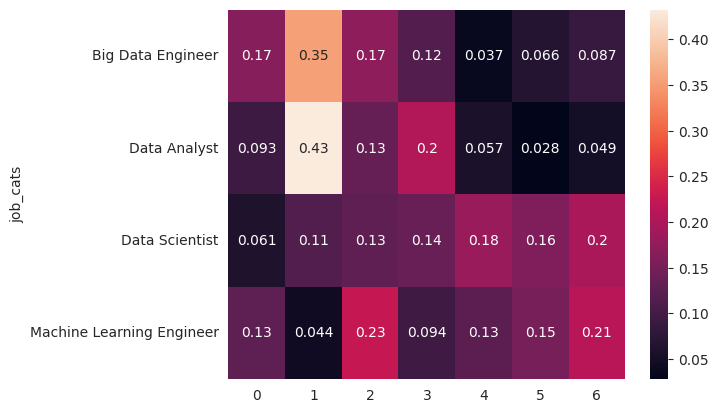

In [ ]:
sns.heatmap(
    nmf_words_probabilities_grouped_df,
    annot=True
)

---

Again LDA and NMF topics are not very informative.
This is possibly because extracted features a
We need to change corpora dictionary. We probably should:

1. Treat words like 'knowledge' amd 'experience' and qualitative adjectives like 'good', 'practical' as stopwords.
2. Treat such words as parts of ngrams and model topics using these ngrams.

---

Still visual analysis of job_cats vs topic probability dostribution shows clear differences.

---

W will use spaCy's Matcher object to extract meaningful ngrams and we will use them to perform topic modeling.

---

## 8. Topic modeling with phrases instead of documents.

### 8.1. Select phrases for further analysis

In [ ]:
working_df.head()

,Unnamed: 0,section-contract,section-workplace,section-technologies,section-responsibilities,section-requirements,title,link,section-technologies-required,section-technologies-optional,position_name,SixMeans_labales,job_cats,section-requirements-spaCy_docs
0,0,salary not specified\n \nB2B contract (full-time),"Kraków, Grzegórzki\nFabryczna 1",Technologies we use\nExpected\nPython\nSQL,Your responsibilities\n- Apply data science te...,Our requirements\nMaster's degree in a quantit...,"Praca Data Scientist , Star Beta Poland sp. z ...",https://theprotocol.it/szczegoly/praca/data-sc...,"[Python, SQL]",[],Data Scientist,0,Data Scientist,"(Our, requirements, \n, Master, 's, degree, in..."
1,1,salary not specified\n \ncontract of employmen...,"Kraków, Grzegórzki\nLubicz 23a",Technologies we use\nExpected\nPython\nGoogle ...,Your responsibilities\nThe main responsibility...,Our requirements\nDeep practical knowledge of ...,"Praca Data Scientist AI Governance, ALTEN Pols...",https://theprotocol.it/szczegoly/praca/data-sc...,"[Python, Google Cloud Platform, Microsoft Azure]",[],Data Scientist AI Governance,0,Data Scientist,"(Our, requirements, \n, Deep, practical, knowl..."
2,2,16 000\n–\n25 000\n \nzł\ngross\n \n/\n \nmth....,"Wrocław, Fabryczna\nWagonowa 2d",Technologies we use\nExpected\nPython\nMachine...,Your responsibilities\nContribute to the desig...,Our requirements\nPython / C++ development\nDa...,"Praca Machine Learning Engineer, Zone IT Sp. z...",https://theprotocol.it/szczegoly/praca/machine...,"[Python, Machine Learning, C, C++]","[Java, Oracle]",Machine Learning Engineer,1,Machine Learning Engineer,"(Our, requirements, \n, Python, /, C++, develo..."
3,3,salary not specified\n \ncontract of employmen...,"Poznań, Wilda\nWierzbięcice 1B\nmultiple locat...",Technologies we use\nExpected\nSQL\nGoogle Clo...,Your responsibilities\nData Management: Collab...,Our requirements\nEducation: Graduated with a ...,"Praca Data Scientist, Allegro, Poznań, Wierzbi...",https://theprotocol.it/szczegoly/praca/data-sc...,"[SQL, Google Cloud Platform, Apache Airflow, V...","[Matplotlib, Plotly, Tableau, Looker, GeoPanda...",Data Scientist,0,Data Scientist,"(Our, requirements, \n, Education, :, Graduate..."
4,4,salary not specified\n \ncontract of mandate,"Warszawa, Wola\nplac Europejski 1",Technologies we use\nExpected\nPython\nGit\nTe...,Your responsibilities\nDesign and implementati...,Our requirements\nGood knowledge of all our co...,Praca Internship – Machine Learning for Audio ...,https://theprotocol.it/szczegoly/praca/interns...,"[Python, Git, TensorFlow]","[C, C++, Linux]",Internship – Machine Learning for Audio Proces...,1,Machine Learning Engineer,"(Our, requirements, \n, Good, knowledge, of, a..."


In [ ]:
# Define POS patterns
patterns = [
    [{"POS": "ADJ"},{"IS_ALPHA": True}, {"POS": "NOUN"}],  # adjective - any word - noun
]

# Initialize Matcher object
matcher = spacy.matcher.Matcher(nl_processor.vocab)

# Add patterns to the Matcher
for pattern in patterns:
    print(pattern, type(pattern))
    matcher.add("Adj", [pattern])

spacy_phrases = []

for doc in working_df['section-requirements-spaCy_docs'].values:
  # Apply the Matcher to the document
  matches = matcher(doc)
  doc_phrases = []
  # Extract matched phrases
  for match_id, start, end in matches:
      span = doc[start:end]
      doc_phrases.append(span.text)
  spacy_phrases.append(doc_phrases)

[{'POS': 'ADJ'}, {'IS_ALPHA': True}, {'POS': 'NOUN'}] <class 'list'>


In [ ]:
len(spacy_phrases) == len(working_df)

True

---

This is good: at last we retrieve strings saturated with more meaning than single words. But lists of phrases are empty for some of the documents. Let's check those docs.

---

In [ ]:
from spacy.lang.en.stop_words import STOP_WORDS

In [ ]:
# Define POS patterns
patterns = [
    [{"POS": "ADJ"},{"IS_ALPHA": True}, {"POS": "NOUN"}],  # adjective - any word - noun
    [{"IS_ALPHA": True}, {"IS_ALPHA": True}, {"LEMMA": "of"}, {"IS_ALPHA": True}],
    [{"IS_ALPHA": True}, {"LEMMA": "to"}, {"IS_ALPHA": True}, {"IS_ALPHA": True}],
    [{"IS_ALPHA": True}, {"LEMMA": "in"}, {"IS_ALPHA": True}, {"IS_ALPHA": True}],
    [{"POS": "NOUN"}, {"TEXT": ","}, {"POS": "NOUN"}, {"TEXT": ","}],
    [{"POS": "NOUN"}, {"POS": "NOUN"}]
]

# Initialize Matcher object
matcher = spacy.matcher.Matcher(nl_processor.vocab)

# Add patterns to the Matcher
for pattern in patterns:
    print(pattern, type(pattern))
    matcher.add("Adj", [pattern])

spacy_phrases = []

for doc in working_df['section-requirements-spaCy_docs'].values:
  # Apply the Matcher to the document
  filtered_doc = [token.text for token in doc if token.text not in STOP_WORDS]
  filtered_doc = spacy.tokens.Doc(vocab=nl_processor.vocab, words=filtered_doc)
  matches = matcher(doc)
  doc_phrases = []
  # Extract matched phrases
  for match_id, start, end in matches:
      span = doc[start:end]
      doc_phrases.append(span.text)
  spacy_phrases.append(doc_phrases)

[{'POS': 'ADJ'}, {'IS_ALPHA': True}, {'POS': 'NOUN'}] <class 'list'>
[{'IS_ALPHA': True}, {'IS_ALPHA': True}, {'LEMMA': 'of'}, {'IS_ALPHA': True}] <class 'list'>
[{'IS_ALPHA': True}, {'LEMMA': 'to'}, {'IS_ALPHA': True}, {'IS_ALPHA': True}] <class 'list'>
[{'IS_ALPHA': True}, {'LEMMA': 'in'}, {'IS_ALPHA': True}, {'IS_ALPHA': True}] <class 'list'>
[{'POS': 'NOUN'}, {'TEXT': ','}, {'POS': 'NOUN'}, {'TEXT': ','}] <class 'list'>
[{'POS': 'NOUN'}, {'POS': 'NOUN'}] <class 'list'>


In [ ]:
len(spacy_phrases) == len(for_gensim_)

True

In [ ]:
spacy_phrases[:2]

[['degree in a quantitative',
  'quantitative and problem',
  'strong academic performance',
  'Strong programming skills',
  'programming skills',
  'skills in Python and',
  'data solutions',
  'Data preprocessing',
  'appropriate data models',
  'data models',
  'a variety of internal',
  'wide experience of mathematical',
  'classical ML algorithms',
  'classification, clustering,',
  'clustering, regression,',
  'dimensionality reduction',
  'reduction etc',
  'trading strategies',
  'risk management',
  'underlying logic of certain',
  'certain trading strategies',
  'trading strategies',
  'ability to conduct high',
  'Modeling experience',
  'world data',
  'Proven record of initiating',
  'top tier research',
  'tier research',
  'research environments',
  'software engineering',
  'English minimum requirement',
  'minimum requirement',
  'able to efficiently communicate',
  'all aspects of your'],
 ['Deep practical knowledge',
  'practical knowledge of AI',
  'deployed in fin

In [ ]:
# Create gensim dictionoray
gensim_phrases_dictionary = Dictionary(spacy_phrases)

# Create a gensim corpus
gensim_phrases_corpus = [gensim_phrases_dictionary.doc2bow(doc) for doc in spacy_phrases]

### 8.2. Latent Semantic Indexing




#### 8.2.1. Build the model, check the topics

In [ ]:
lsi_model_phrases = LsiModel(
    corpus=gensim_phrases_corpus,
    num_topics=7,
    id2word=gensim_phrases_dictionary
)

In [ ]:
lsi_model_phrases.show_topics()

[(0,
  '-0.696*"machine learning" + -0.240*"Experience in creating processes" + -0.202*"computer science" + -0.170*"learning algorithms" + -0.134*"data sets" + -0.134*"large data sets" + -0.131*"Experience in working with" + -0.123*"Good knowledge of Python" + -0.123*"code management" + -0.123*"source code"'),
 (1,
  '-0.307*"business problems" + -0.236*"programming languages" + -0.195*"data analysis" + -0.175*"software development" + -0.154*"development methodologies" + -0.154*"outcome delivery" + -0.150*"version control" + 0.149*"Experience in creating processes" + -0.134*"Experience building" + -0.133*"data science"'),
 (2,
  '-0.377*"data analysis" + 0.196*"business problems" + -0.174*"language processing" + -0.174*"natural language processing" + -0.127*"optimization methods" + -0.127*"data visualization" + 0.122*"development methodologies" + 0.122*"outcome delivery" + 0.120*"Experience in creating processes" + -0.118*"data engineering"'),
 (3,
  '-0.423*"data science" + -0.229*"co

In [ ]:
lsi_phrases_u_df = pd.DataFrame(data=lsi_model_phrases.projection.u)

#### 8.2.2. Compare most frequent terms per topic

In [ ]:
most_frequent_terms_dct = {}
for topic_column in lsi_phrases_u_df.columns:
  terms = (lsi_phrases_u_df.sort_values(by=topic_column, ascending=False, key=abs).index).to_numpy().astype(np.int_)[:17]
  most_frequent_terms_dct[topic_column] = terms

pd.DataFrame(most_frequent_terms_dct).replace(dict(gensim_phrases_dictionary.items()))

,0,1,2,3,4,5,6
0,machine learning,business problems,data analysis,data science,data analysis,data processing,communication skills
1,Experience in creating processes,programming languages,business problems,communication skills,feature engineering,experience in a similar,data mining
2,computer science,data analysis,natural language processing,programming skills,learning techniques,"coding, documentation,",software engineering
3,learning algorithms,software development,language processing,programming languages,data engineers,streaming technologies,good communication skills
4,data sets,outcome delivery,optimization methods,recommendation systems,Strong understanding of machine,database types,recommendation systems
5,large data sets,development methodologies,data visualization,software engineering,data wrangling,good big data,business problems
6,Experience in working with,version control,development methodologies,data mining,large volumes of textual,data sources,Ability to think logically
7,Good knowledge of Python,Experience in creating processes,outcome delivery,dimensionality reduction,effective feature engineering,implementation standards,programming skills
8,code management,Experience building,Experience in creating processes,learning models,domain experts,multiple data sources,experience in data mining
9,source code,data science,data engineering,knowledge in the area,document classification,data formats,Four years of experience


#### 8.2.3. Visualize topic vs job_cats distribution

In [ ]:
lsi_phrases_vectors_generator = lsi_model_phrases[gensim_phrases_corpus]

In [ ]:
lsi_phrases_vectors = [x for x in lsi_phrases_vectors_generator]

In [ ]:
lsi_phrases_vectors_df = pd.DataFrame(lsi_phrases_vectors)

In [ ]:
lsi_phrases_vectors_df

,0,1,2,3,4,5,6
0,"(0, -0.14116869367960416)","(1, -0.28217028283723466)","(2, 0.013334601993536019)","(3, -0.9223750021520134)","(4, 0.2676227587255218)","(5, -0.011253557507904008)","(6, -0.04263467496320038)"
1,None,None,None,None,None,None,None
2,None,None,None,None,None,None,None
3,"(0, -1.0254719935685235)","(1, -0.6434314817536806)","(2, 0.11044870030727727)","(3, 0.17058694810873862)","(4, 0.041406479327445164)","(5, -0.03808673033586265)","(6, 0.28969576795778695)"
4,"(0, -1.106772668167693)","(1, -0.09900272268343115)","(2, -0.40107191876142406)","(3, 0.08862863605220703)","(4, -0.311291328067963)","(5, 0.03739647330854147)","(6, -0.04142692559987906)"
...,...,...,...,...,...,...,...
334,"(0, -0.03275564975429574)","(1, -0.03186922539909855)","(2, -0.027846315207530392)","(3, -0.027632429336414726)","(4, 0.004072344165429752)","(5, 0.23489529519458757)","(6, 0.014928210947687225)"
335,"(0, -0.010254055035850472)","(1, -0.0028134622951788)","(2, 0.0019829493652992456)","(3, -0.011702039441520401)","(4, 0.0022917848165136664)","(5, 0.02776705038588129)","(6, -0.007340798346100515)"
336,"(0, -0.3543145442800641)","(1, -0.32711545832554245)","(2, 0.07219150539716943)","(3, 0.189325460049091)","(4, 0.021828274912184788)","(5, -0.0026095609035108828)","(6, 0.008779544315773)"
337,"(0, -0.0043455372448840965)","(1, -0.0023615221451340775)","(2, 0.0003097500237648944)","(3, -0.010479992509247398)","(4, 0.004597813103629443)","(5, 0.002964411867246931)","(6, -0.011909464067227486)"


In [ ]:
lsi_phrases_vectors_df = lsi_phrases_vectors_df.applymap(lambda x: x[1] if x is not None else None)

In [ ]:
lsi_phrases_vectors_df

,0,1,2,3,4,5,6
0,-0.141169,-0.282170,0.013335,-0.922375,0.267623,-0.011254,-0.042635
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,-1.025472,-0.643431,0.110449,0.170587,0.041406,-0.038087,0.289696
4,-1.106773,-0.099003,-0.401072,0.088629,-0.311291,0.037396,-0.041427
...,...,...,...,...,...,...,...
334,-0.032756,-0.031869,-0.027846,-0.027632,0.004072,0.234895,0.014928
335,-0.010254,-0.002813,0.001983,-0.011702,0.002292,0.027767,-0.007341
336,-0.354315,-0.327115,0.072192,0.189325,0.021828,-0.002610,0.008780
337,-0.004346,-0.002362,0.000310,-0.010480,0.004598,0.002964,-0.011909


In [ ]:
# Check out how lsi-modeled topics are distributed over job categories
job_cats_vs_lsi_phrases_topic_df = pd.DataFrame(
    {
        'job_cats': working_df['job_cats'].values,
        'lsi_phrases_topic_1': lsi_phrases_vectors_df.to_numpy().argsort()[:,-1],
        'lsi_phrases_topic_2': lsi_phrases_vectors_df.to_numpy().argsort()[:,-2],
        'lsi_phrases_topic_3': lsi_phrases_vectors_df.to_numpy().argsort()[:,-3],

    }
)

In [ ]:
job_cats_vs_lsi_phrases_topic_df

,job_cats,lsi_phrases_topic_1,lsi_phrases_topic_2,lsi_phrases_topic_3
0,Data Scientist,4,2,5
1,Data Scientist,6,5,4
2,Machine Learning Engineer,6,5,4
3,Data Scientist,6,3,2
4,Machine Learning Engineer,3,5,6
...,...,...,...,...
334,Data Analyst,5,6,4
335,Data Analyst,5,4,2
336,Data Scientist,3,2,4
337,Data Scientist,4,5,2


---

There is a slight problem: when all values for a doccument (so: in a row) are None Numpy's argsort() function returns sorts indices and returns them according to original array's order.

---

Let's check what is the scale of this involuntary imputing.

---

In [ ]:
(sum(lsi_phrases_vectors_df.isna().sum(axis=1)) / 7) / len(working_df)

0.09144542772861357

---

Nine percent is a little bit high. Again: to preserve systemic character of the research we will still plot hetmaps showing the distribution of topics among joob cats.

---

In [ ]:
lsi_phrases_vectors_grouped_df = lsi_phrases_vectors_df.groupby(working_df['job_cats']).mean()
lsi_phrases_vectors_grouped_df

,0,1,2,3,4,5,6
job_cats,,,,,,,
Big Data Engineer,-0.070188,-0.058538,-0.071412,-0.073431,0.023820,1.313058,0.059067
Data Analyst,-0.230290,-0.086256,-0.062967,-0.232838,-0.038059,0.145015,-0.413373
Data Scientist,-1.324404,-0.301377,-0.229802,-0.345692,0.174444,-0.034386,-0.038936
Machine Learning Engineer,-0.719385,-0.697396,0.327619,-0.075892,0.065502,0.409134,-0.159413


<Axes: ylabel='job_cats'>

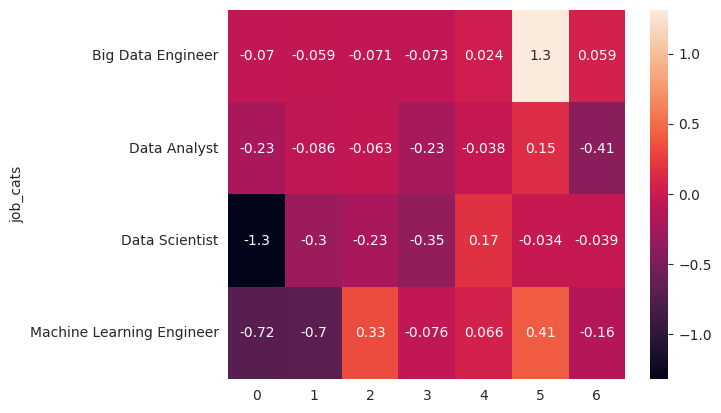

In [ ]:
sns.heatmap(
    lsi_phrases_vectors_grouped_df,
    annot = True
)

#### 8.2.4. Build coherence model for LSI, show topics as word lists

In [ ]:
# Create a coherence model with your trained LSI model, corpus, and dictionary
coherence_model_lsi_phrases = gensim.models.coherencemodel.CoherenceModel(model=lsi_model_phrases,
                                  texts=working_df['section-requirements'].to_list(),
                                  corpus=gensim_phrases_corpus,
                                  dictionary=gensim_phrases_dictionary,
                                  window_size=7,
                                  topn=3,
                                  coherence='c_v')  # You can choose the coherence measure you want to use

# Calculate the coherence score
with np.errstate(invalid='ignore'):
  coherence_score_lsi_phrases = coherence_model_lsi_phrases.get_coherence()

print("Coherence Score:", coherence_score_lsi_phrases)

Coherence Score: nan


/usr/local/lib/python3.10/dist-packages/gensim/topic_coherence/direct_confirmation_measure.py:204: RuntimeWarning: divide by zero encountered in scalar divide
  m_lr_i = np.log(numerator / denominator)


In [ ]:
pd.DataFrame(coherence_model_lsi_phrases.top_topics_as_word_lists(
    model=lsi_model_phrases,
    dictionary=gensim_phrases_dictionary)).T

,0,1,2,3,4,5,6
0,to practice of assessing,Experience in creating processes,business problems,programming languages,feature engineering,data processing,recommendation systems
1,possible ethical issues,data sets,development methodologies,data analysis,learning techniques,experience in a similar,business problems
2,articulation skills,large data sets,outcome delivery,language processing,data engineers,big data processing,programming skills
3,High standards of professional,Experience in working with,Experience in creating processes,natural language processing,Strong understanding of machine,Ability to create automation,learning models
4,stakeholder relationships,Knowledge in the field,software development,Experience in creating processes,data wrangling,various data formats,data modeling
5,Experience in developing techniques,the field of CI,Experience building,data structures,document classification,"coding, documentation,",expert level knowledge
6,practical knowledge of AI,REST APIs,feature stores,different programming languages,large volumes of textual,communicative knowledge of English,experience in deploying Python
7,research in areas such,learning solutions,good grasp of at,data technologies,document categorization,data formats,"speed, scalability,"
8,verbal articulation skills,"learning, statistics,",with experience of different,how to solving real,art techniques,data sources,in any of the
9,Ability to understand complex,management tools,specific business problems,common data structures,effective feature engineering,"design, coding,",large scale datasets


### 8.3. Hierarchical Drichlet Process

#### 8.3.1. Build the model, check the topics

In [ ]:
hdp_phrases_model = HdpModel(
    corpus=gensim_phrases_corpus,
    T=7,
    id2word=gensim_phrases_dictionary
)

In [ ]:
hdp_phrases_model.show_topics()

[(0,
  '0.007*software development + 0.007*the context of real + 0.005*Experience in writing production + 0.005*ability to establish relationships + 0.005*analysis, architecture, + 0.005*series analysis + 0.005*experience in one of + 0.005*real world business + 0.005*high technological complexity + 0.004*reporting solutions + 0.004*recommendation systems + 0.004*large data sets + 0.004*thorough knowledge of pandas + 0.004*skills in the area + 0.004*available Python packages + 0.004*Data presentation + 0.004*business requirements + 0.004*business approach + 0.004*one year of practice + 0.004*development methodologies'),
 (1,
  '0.007*Background in biomedical engineering + 0.006*common data structures + 0.006*degree in Computer Science + 0.005*event sourcing + 0.005*related to quantitative analysis + 0.005*codes in the area + 0.004*conducting analyzes + 0.004*cloud systems + 0.004*production model + 0.004*problem in many dimensions + 0.004*the field of artificial + 0.004*willingness to a

---

Once again HDP clustering seems to be a little more fruitfull. The model has successfully abstracted meaningful terms and topics differ from each other significantly.

---

#### 8.3.2. Visualize topic vs job_cats distribution

In [ ]:
# Check
hdp_phrases_inferred_topics = [hdp_phrases_model.inference(chunk=[single_document]) for single_document in gensim_phrases_corpus ]
hdp_phrases_topics_df = pd.DataFrame(np.array(hdp_phrases_inferred_topics).squeeze())
print(hdp_phrases_topics_df)

             0         1          2         3         4         5          6
0    11.599848  0.151509  14.644357  0.127557  8.206971  0.131001   0.138756
1     0.174517  0.151939   0.142400  0.127536  6.913463  7.961796   3.528350
2     0.000000  0.000000   0.000000  0.000000  0.000000  0.000000   0.000000
3     0.174295  0.151633   0.142619  0.127424  9.949125  9.316179   0.138724
4     4.970466  0.152206   0.142335  0.127480  0.140069  3.999539   4.467905
..         ...       ...        ...       ...       ...       ...        ...
334   5.878872  0.151641   0.142585  0.127570  3.029172  0.130937   3.539224
335   0.174288  0.151552   0.142249  0.127402  0.139942  6.126103   0.138463
336   5.619581  0.151556   4.964571  0.127384  6.867226  0.130904   0.138779
337   0.174320  0.151846   7.571336  6.132382  2.700653  0.130875   0.138588
338   3.900211  0.151714   0.142232  3.850126  0.140101  0.130928  13.684689

[339 rows x 7 columns]


In [ ]:
hdp_phrases_vectors_grouped_df = hdp_phrases_topics_df.groupby(working_df['job_cats']).mean()
hdp_phrases_vectors_grouped_df

,0,1,2,3,4,5,6
job_cats,,,,,,,
Big Data Engineer,2.180878,0.468309,0.427754,2.876986,0.932639,1.190915,5.008234
Data Analyst,3.046231,2.493068,0.936745,2.062014,2.023028,1.451874,2.433193
Data Scientist,3.894947,1.493971,2.886348,3.143320,2.841557,4.385951,3.229768
Machine Learning Engineer,3.726803,4.267089,2.752510,2.275599,3.127337,2.415358,2.562964


<Axes: ylabel='job_cats'>

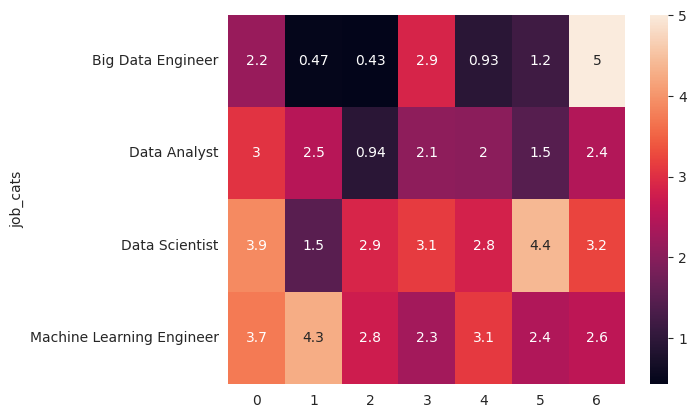

In [ ]:
sns.heatmap(
    hdp_phrases_vectors_grouped_df,
    annot = True
)

---

Heatmaps show significant difference between job categories. While Data Scientist and Machine Learning Engineer show somewhat "equal" gamma distributions, Big Data Engineer seem to differ more across the topics than former job cats.

---

#### 8.3.3. Inspect most frequent topics for given job cats

#### 8.3.3.1. Big Data Engineer topics

In [ ]:
hdp_phrases_model.show_topics()[hdp_phrases_vectors_grouped_df.iloc[0].argmax()]

(6,
 '0.006*design environment + 0.006*data sources + 0.005*Experience in data analysis + 0.005*degree in computer science + 0.005*tier research + 0.005*Experience in data visualization + 0.004*experience in implementing ERP + 0.004*Demonstratable experience of building + 0.004*Ability to cooperate with + 0.004*report recipients + 0.004*different information retrieval + 0.004*computing frameworks + 0.004*related to Data Science + 0.004*Experience in working for + 0.004*be knowledge of the + 0.004*business hypothesis + 0.003*and to develop skills + 0.003*design skills + 0.003*matured topics of Data + 0.003*Advanced understanding of SQL')

In [ ]:
hdp_phrases_model.show_topics()[hdp_phrases_vectors_grouped_df.iloc[0].to_numpy().argsort()[-2]]

(3,
 '0.009*end solutions + 0.006*project planning + 0.005*Communication skills + 0.005*engineering methods + 0.005*stress resistance + 0.004*techniques to support algorithm + 0.004*level knowledge + 0.004*one year of experience + 0.004*design, coding, + 0.004*-armed bandits + 0.004*ability to set priorities + 0.004*production environment + 0.004*Basic knowledge of Data + 0.004*pipelines in production environment + 0.004*•Excellent team work + 0.004*retail, telecommunications, + 0.004*especially in the context + 0.004*IT tools + 0.004*anomaly detection + 0.004*data manipulation')

#### 8.3.3.2. Data Analyst topics

In [ ]:
hdp_phrases_model.show_topics()[hdp_phrases_vectors_grouped_df.iloc[1].to_numpy().argsort()[-1]]

(0,
 '0.007*software development + 0.007*the context of real + 0.005*Experience in writing production + 0.005*ability to establish relationships + 0.005*analysis, architecture, + 0.005*series analysis + 0.005*experience in one of + 0.005*real world business + 0.005*high technological complexity + 0.004*reporting solutions + 0.004*recommendation systems + 0.004*large data sets + 0.004*thorough knowledge of pandas + 0.004*skills in the area + 0.004*available Python packages + 0.004*Data presentation + 0.004*business requirements + 0.004*business approach + 0.004*one year of practice + 0.004*development methodologies')

In [ ]:
hdp_phrases_model.show_topics()[hdp_phrases_vectors_grouped_df.iloc[1].to_numpy().argsort()[-2]]

(1,
 '0.007*Background in biomedical engineering + 0.006*common data structures + 0.006*degree in Computer Science + 0.005*event sourcing + 0.005*related to quantitative analysis + 0.005*codes in the area + 0.004*conducting analyzes + 0.004*cloud systems + 0.004*production model + 0.004*problem in many dimensions + 0.004*the field of artificial + 0.004*willingness to adapt to + 0.004*experience in statistical and + 0.004*working in a customer + 0.004*verbal communication skills + 0.004*modelling, statistics, + 0.004*skills in the following + 0.004*experience in developing and + 0.004*Labor market + 0.004*team work')

#### 8.3.3.3. Data Scientist topics

In [ ]:
hdp_phrases_model.show_topics()[hdp_phrases_vectors_grouped_df.iloc[2].to_numpy().argsort()[-1]]

(5,
 '0.005*strong understanding of the + 0.005*Basic knowledge of Google + 0.005*the performance of NLP + 0.004*Good work organization + 0.004*mathematical optimization methods + 0.004*science project + 0.004*suitable for server + 0.004*production environment + 0.004*Data preprocessing + 0.004*science roles + 0.004*research in areas such + 0.004*data engineering + 0.004*probabilistic and optimization + 0.004*related to data science + 0.004*experience in software engineering + 0.004*the probability of random + 0.004*data access + 0.003*effective communication of complex + 0.003*•Excellent team work + 0.003*related software lifecycle')

In [ ]:
hdp_phrases_model.show_topics()[hdp_phrases_vectors_grouped_df.iloc[2].to_numpy().argsort()[-2]]

(0,
 '0.007*software development + 0.007*the context of real + 0.005*Experience in writing production + 0.005*ability to establish relationships + 0.005*analysis, architecture, + 0.005*series analysis + 0.005*experience in one of + 0.005*real world business + 0.005*high technological complexity + 0.004*reporting solutions + 0.004*recommendation systems + 0.004*large data sets + 0.004*thorough knowledge of pandas + 0.004*skills in the area + 0.004*available Python packages + 0.004*Data presentation + 0.004*business requirements + 0.004*business approach + 0.004*one year of practice + 0.004*development methodologies')

#### 8.3.3.4. Machine Learning Engineer topics

In [ ]:
hdp_phrases_model.show_topics()[hdp_phrases_vectors_grouped_df.iloc[3].to_numpy().argsort()[-1]]

(1,
 '0.007*Background in biomedical engineering + 0.006*common data structures + 0.006*degree in Computer Science + 0.005*event sourcing + 0.005*related to quantitative analysis + 0.005*codes in the area + 0.004*conducting analyzes + 0.004*cloud systems + 0.004*production model + 0.004*problem in many dimensions + 0.004*the field of artificial + 0.004*willingness to adapt to + 0.004*experience in statistical and + 0.004*working in a customer + 0.004*verbal communication skills + 0.004*modelling, statistics, + 0.004*skills in the following + 0.004*experience in developing and + 0.004*Labor market + 0.004*team work')

In [ ]:
hdp_phrases_model.show_topics()[hdp_phrases_vectors_grouped_df.iloc[3].to_numpy().argsort()[-2]]

(0,
 '0.007*software development + 0.007*the context of real + 0.005*Experience in writing production + 0.005*ability to establish relationships + 0.005*analysis, architecture, + 0.005*series analysis + 0.005*experience in one of + 0.005*real world business + 0.005*high technological complexity + 0.004*reporting solutions + 0.004*recommendation systems + 0.004*large data sets + 0.004*thorough knowledge of pandas + 0.004*skills in the area + 0.004*available Python packages + 0.004*Data presentation + 0.004*business requirements + 0.004*business approach + 0.004*one year of practice + 0.004*development methodologies')

#### 8.3.4. Document clustering using HDP phrases model topics.

In [ ]:
hdp_phrases_kmeans_6 = KMeans(n_clusters=6, random_state=SEED)
hdp_phrases_kmeans_6.fit(hdp_phrases_topics_df)

hdp_phrases_kmeans_6_labels = hdp_phrases_kmeans_6.labels_

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


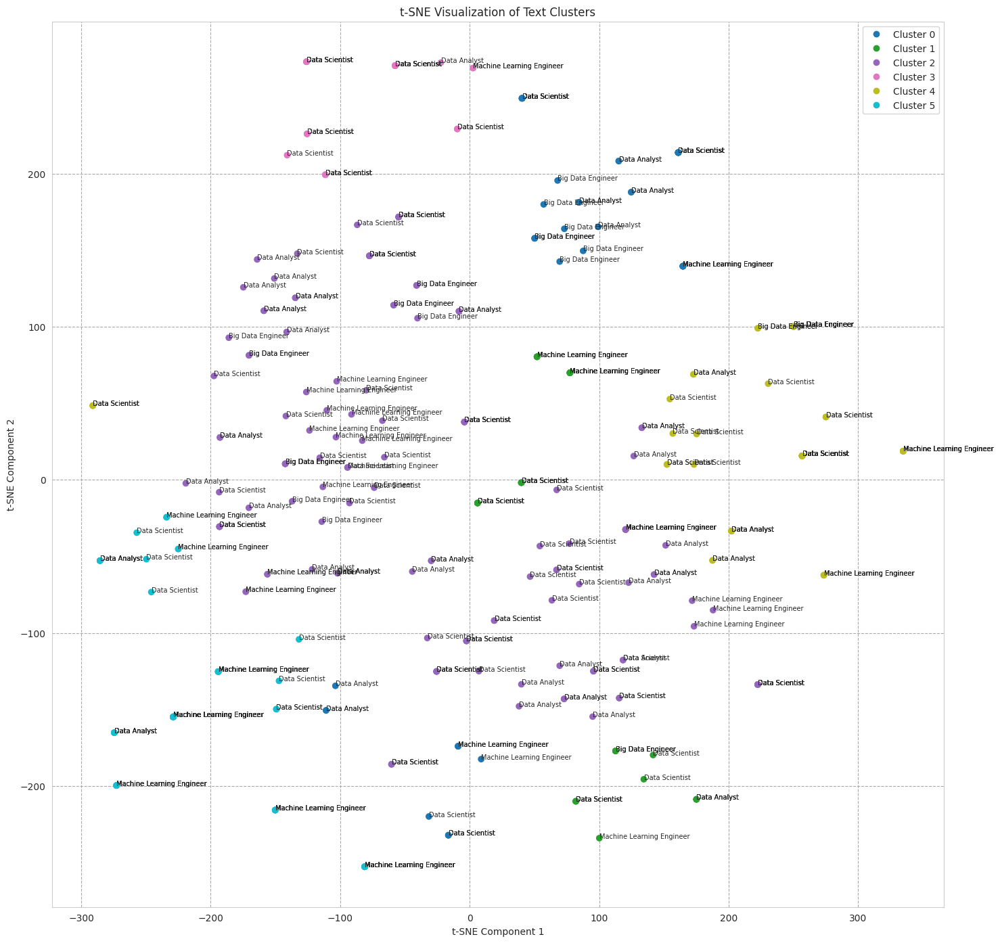

In [ ]:
# Reduce dimensionality using t-SNE
tsne = TSNE(n_components=2, random_state=SEED)
X_tsne = tsne.fit_transform(hdp_phrases_topics_df.to_numpy())

# Plot the points colored by cluster labels
plt.figure(figsize=(17, 17))

scatter = plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=hdp_phrases_kmeans_6_labels, cmap='tab10', label=hdp_phrases_kmeans_6_labels)

# Add labels for each point
for i, txt in enumerate(working_df['job_cats'].values):
    plt.annotate(txt, (X_tsne[i, 0], X_tsne[i, 1]), fontsize=7)

plt.title('t-SNE Visualization of Text Clusters')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.legend(handles=scatter.legend_elements()[0], labels=[f'Cluster {digit}' for digit in np.unique(hdp_phrases_kmeans_6_labels)])
plt.show()

### 8.4. Latent Drichlet Allocation

#### 8.4.1. Build the model, show topics

In [ ]:
lda_phrases_model = LdaModel(
    corpus=gensim_phrases_corpus,
    num_topics=7,
    id2word=gensim_phrases_dictionary,
    passes=13,
    iterations=71,
    random_state=SEED
)

In [ ]:
lda_phrases_model.show_topics()

[(0,
  '0.022*"data analysis" + 0.015*"machine learning" + 0.010*"work experience" + 0.010*"data engineering" + 0.009*"degree in Computer Science" + 0.009*"teamwork skills" + 0.009*"game engines" + 0.009*"order to communicate with" + 0.009*"engineering skills" + 0.009*"Programing skills"'),
 (1,
  '0.030*"machine learning" + 0.023*"business problems" + 0.018*"Experience building" + 0.016*"software development" + 0.015*"data structures" + 0.012*"computer science" + 0.012*"building data" + 0.012*"programming languages" + 0.012*"real world business" + 0.012*"specific business problems"'),
 (2,
  '0.059*"machine learning" + 0.025*"Experience in creating processes" + 0.021*"large data sets" + 0.021*"data sets" + 0.019*"computer science" + 0.018*"Experience in working with" + 0.012*"learning algorithms" + 0.012*"Good knowledge of Python" + 0.012*"code management" + 0.012*"source code"'),
 (3,
  '0.023*"machine learning" + 0.016*"data processing" + 0.014*"data science" + 0.012*"communication 

---

Once again - topics are basically the same ...

---

#### 8.4.2. Visualize topic vs job_cats distribution

In [ ]:
lda_phrases_topics_per_document = [lda_phrases_model.get_document_topics(x) for x in gensim_phrases_corpus]

In [ ]:
a_list_for_topic_lda_phrases_df = []
for document in lda_phrases_topics_per_document:
  document_dcts = {}
  for a_tuple in document:
    document_dcts[a_tuple[0]] = a_tuple[1]
  a_list_for_topic_lda_phrases_df.append(document_dcts)

In [ ]:
lda_phrases_topic_per_document_probabilities = pd.DataFrame(a_list_for_topic_lda_phrases_df, columns= np.arange(7)).fillna(0.0)

In [ ]:
lda_phrases_topic_per_document_probabilities.describe()

,0,1,2,3,4,5,6
count,339.000000,339.000000,339.000000,339.000000,339.000000,339.000000,339.000000
mean,0.201080,0.117606,0.155649,0.155222,0.095141,0.092431,0.158884
std,0.371808,0.296401,0.336421,0.338297,0.266602,0.262726,0.340498
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.142857,0.015921,0.020409,0.020415,0.015874,0.014287,0.020410
max,0.972345,0.973209,0.978000,0.980049,0.975503,0.980515,0.986804


In [ ]:
lda_phrases_probabilities_grouped_df = lda_phrases_topic_per_document_probabilities.groupby(working_df['job_cats']).mean()
lda_phrases_probabilities_grouped_df

,0,1,2,3,4,5,6
job_cats,,,,,,,
Big Data Engineer,0.316284,0.015099,0.015100,0.034144,0.368249,0.015099,0.224891
Data Analyst,0.170989,0.054542,0.143485,0.198796,0.076532,0.093424,0.247283
Data Scientist,0.109538,0.055762,0.238661,0.160893,0.081843,0.159882,0.162075
Machine Learning Engineer,0.320200,0.294778,0.088340,0.161424,0.026834,0.016492,0.068258


<Axes: ylabel='job_cats'>

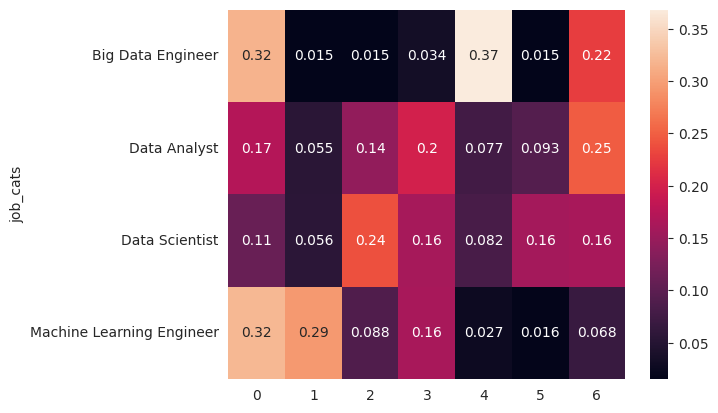

In [ ]:
sns.heatmap(
    lda_phrases_probabilities_grouped_df,
    annot = True
)

---

However shown topics seem inconclusive, still visual analysis of topic distribution vs job categories seem quite revealing.

---

### 8.5. Non-Negative Matrix factorization

#### 8.5.1. Build the model, show topics

In [ ]:
nmf_model_phrases = Nmf(
    corpus=gensim_phrases_corpus,
    num_topics=7,
    id2word=gensim_phrases_dictionary,
    random_state=SEED
)

In [ ]:
nmf_model_phrases.show_topics()

[(0,
  '0.068*"machine learning" + 0.027*"computer science" + 0.015*"learning techniques" + 0.014*"Experience in creating processes" + 0.012*"learning algorithms" + 0.012*"Experience in working with" + 0.010*"code management" + 0.010*"source code" + 0.009*"data engineers" + 0.008*"large data sets"'),
 (1,
  '0.021*"data science" + 0.011*"communication skills" + 0.011*"neural network models" + 0.011*"network models" + 0.010*"waveform data" + 0.010*"models to embedded platforms" + 0.010*"code development" + 0.010*"Experience in porting neural" + 0.009*"earlier stages of their" + 0.009*"code version"'),
 (2,
  '0.027*"programming languages" + 0.025*"data analysis" + 0.021*"business problems" + 0.014*"version control" + 0.010*"communication skills" + 0.009*"different programming languages" + 0.009*"specific business problems" + 0.009*"software lifecycle" + 0.009*"run in the cloud" + 0.009*"lifecycle tooling"'),
 (3,
  '0.016*"data analysis" + 0.012*"data mining" + 0.009*"data processing" +

#### 8.5.2. Visualize topic vs job_cats distribution

In [ ]:
nmf_topics_per_document = [nmf_model_phrases.get_document_topics(x) for x in gensim_phrases_corpus]

In [ ]:
a_list_for_topic_nmf_phrases_df = []
for document in nmf_topics_per_document:
  document_dcts = {}
  for a_tuple in document:
    document_dcts[a_tuple[0]] = a_tuple[1]
  a_list_for_topic_nmf_phrases_df.append(document_dcts)

In [ ]:
nmf_topic_per_document_probabilities = pd.DataFrame(a_list_for_topic_nmf_phrases_df, columns= np.arange(7)).fillna(0.0)

In [ ]:
nmf_topic_per_document_probabilities.describe()

,0,1,2,3,4,5,6
count,339.000000,339.000000,339.000000,339.000000,339.000000,339.000000,339.000000
mean,0.165727,0.110245,0.106625,0.138402,0.210969,0.115771,0.101458
std,0.257454,0.211302,0.198974,0.246820,0.280762,0.227991,0.205024
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.036993,0.000000,0.000000
75%,0.284711,0.129013,0.162394,0.221781,0.369085,0.094478,0.118367
max,1.000000,1.000000,1.000000,0.897391,1.000000,1.000000,0.868261


In [ ]:
nmf_phrases_probabilities_grouped_df = nmf_topic_per_document_probabilities.groupby(working_df['job_cats']).mean()
nmf_phrases_probabilities_grouped_df

,0,1,2,3,4,5,6
job_cats,,,,,,,
Big Data Engineer,0.034243,0.020251,0.177792,0.234075,0.346323,0.090562,0.096754
Data Analyst,0.111011,0.139991,0.131327,0.178863,0.156014,0.211758,0.070889
Data Scientist,0.213368,0.141568,0.100046,0.108191,0.228542,0.048474,0.103487
Machine Learning Engineer,0.179030,0.074867,0.073194,0.121404,0.171467,0.162591,0.121216


<Axes: ylabel='job_cats'>

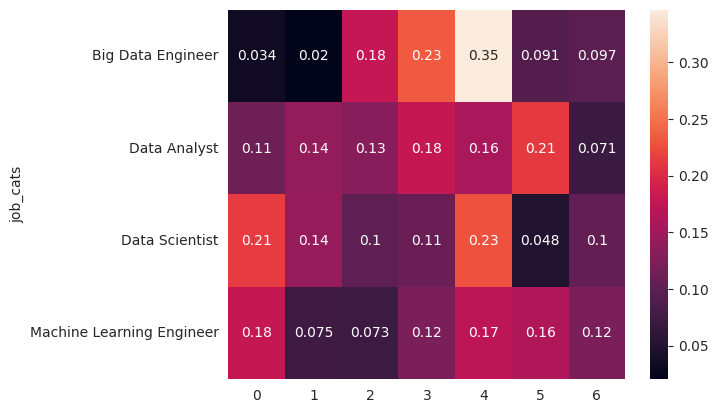

In [ ]:
sns.heatmap(
    nmf_phrases_probabilities_grouped_df,
    annot=True
)

---

Job catrgories differ from each other significantly. Ananlysis of non-negative matrix factorization topic probabilities distribution between job categories show (what we have seen before) that data scientist job is somewhat similar to data analyst's job (we know that sometimes job offers disguise data analyst jobs as data scientist) and machine learning engineer job. Also machine learning engineers may be the most verstile profession of all analyzed professions.

---

## 9. Topic modeling - whole sentences

#### 9.1. Create corpus and dictionary for whole sentences

In [ ]:
stop_words_3 = [
    'our requirements',
    "our expectations",
    "optional",
    "welcome",
]

In [ ]:
# Create a list resembling structure of the corpus
spacy_sentences = []

# Iterating through spaCy Doc objects
for document in working_df['section-requirements-spaCy_docs'].values:
    doc_sentences = []
    for sentence in document.sents:
        sub_sentences = sentence.text.split('\n')
        for sub_sentence in sub_sentences:
            # Preprocess each sentence
            preprocessed_doc = "".join(token.lower() for token in sub_sentence )
            if preprocessed_doc not in stop_words_3:
                doc_sentences.append(preprocessed_doc)
    # Append document's sentences to spacy_sentences
    spacy_sentences.append(doc_sentences)

In [ ]:
spacy_sentences_docs = [nl_processor(" ".join(sentence)) for sentence in spacy_sentences]

In [ ]:
len(spacy_sentences_docs) == len(working_df)

True

In [ ]:
# Create gensim dictionoray
gensim_sentences_dictionary = Dictionary(spacy_sentences)

# Create a gensim corpus
gensim_sentences_corpus = [gensim_sentences_dictionary.doc2bow(doc) for doc in spacy_sentences]

In [ ]:
len(gensim_sentences_corpus) == len(working_df)

True

### 9.2. Latent Semantic Indexing




#### 9.2.1. Build the model, show topics

In [ ]:
lsi_model_sentences = LsiModel(
    corpus=gensim_sentences_corpus,
    num_topics=7,
    id2word=gensim_sentences_dictionary
)

In [ ]:
lsi_model_sentences.show_topics()

[(0,
  '0.995*"" + 0.016*"good knowledge of spoken and written english." + 0.016*"knowledge in the field of ci/cd." + 0.016*"experience in creating processes for building and implementing machine learning solutions." + 0.016*"experience in creating processes for building and implementing ml solutions" + 0.016*"experience in object-oriented programming in python and working with numpy, dataframe, pandas libraries." + 0.016*"experience in working with large data sets." + 0.016*"minimum 3 years of experience as a data scientist." + 0.016*"punctuality, accuracy, inquisitiveness, task-oriented." + 0.016*"knowledge of machine learning, statistics, simulation, optimization."'),
 (1,
  '-0.243*"experience in object-oriented programming in python and working with numpy, dataframe, pandas libraries." + -0.243*"good knowledge of python, sql, azure, git." + -0.243*"punctuality, accuracy, inquisitiveness, task-oriented." + -0.243*"experience configuring and interacting with rest apis." + -0.243*"ex

#### 9.2.2. Compare most frequent terms per topic

In [ ]:
lsi_sentences_u_df = pd.DataFrame(data=lsi_model_sentences.projection.u)

In [ ]:
most_frequent_terms_dct = {}
for topic_column in lsi_sentences_u_df.columns:
  terms = (lsi_sentences_u_df.sort_values(by=topic_column, ascending=False, key=abs).index).to_numpy().astype(np.int_)[:17]
  most_frequent_terms_dct[topic_column] = terms

pd.DataFrame(most_frequent_terms_dct).replace(dict(gensim_sentences_dictionary.items()))

,0,1,2,3,4,5,6
0,,good knowledge of spoken and written english.,"experience with various data formats: json, pa...","university degree in computer science, machine...","strong software engineering skills, with exper...","strong software engineering skills, with exper...",proficiency in using development tools (profil...
1,good knowledge of spoken and written english.,"punctuality, accuracy, inquisitiveness, task-o...",ability to create automation scripts (ansible),familiarity with collaboration tools and metho...,you can empathise with others and modify your ...,commercial experience contributing to the succ...,"experience in workflow automation solutions, e..."
2,"punctuality, accuracy, inquisitiveness, task-o...",experience configuring and interacting with re...,understanding database types and usage scenari...,solid software engineering skills in python.,"strategic thinking, with a demonstrable abilit...",4-5 years of experience working as a ml engine...,experience in ml research in r&d or academia.
3,minimum 3 years of experience as a data scient...,experience in creating processes for building ...,practical knowledge of agile processes and too...,programing skills in strongly typed languages ...,you place the needs of our customers as the hi...,search and recommendation experience is desira...,"experience in building, evaluating or deployin..."
4,"knowledge of source code management tools, e.g...",experience in creating processes for building ...,practical knowledge in ci/cd automation,practical experience with ml / data science re...,a high degree of emotional intelligence: you a...,the ability to apply technical skills and know...,experience in building and leading technical t...
5,knowledge of machine learning algorithms.,experience in object-oriented programming in p...,practical experience in implementing and optim...,"familiarity with robotics, sensors and simulat...",ability to influence technical teams and senio...,understanding of common data structures and al...,"devops experience (ci/cd, testing, automation ..."
6,knowledge in the field of ci/cd.,experience in working with large data sets.,fluent knowledge of polish and communicative k...,good understanding of deep learning concepts w...,customer focus.,"experience with tooling for monitoring, loggin...",demonstrated ability to use metrics to back up...
7,"higher education (mathematics, computer scienc...","good knowledge of python, sql, azure, git.",higher education (technical fields),experience with object detection – 2d and 3d (...,"enterprise integration patterns, microservice ...",experience with software development methodolo...,"degree in computer science, mathematics or ano..."
8,"knowledge of machine learning, statistics, sim...","higher education (mathematics, computer scienc...","knowledge of big data, data warehouse and data...","experience with cloud infrastructure, especial...",excellent written and verbal communication ski...,experience building solutions that run in the ...,4+ years hands-on experience in python and its...
9,"good knowledge of python, sql, azure, git.",knowledge in the field of ci/cd.,knowledge of good big data processing practice...,experience in fine-tuning llms,you can find the right balance between outcome...,demonstratable experience of building scalable...,experience in working with nosql databases e.g...


#### 9.2.3. Visualize topic vs job_cats distribution

In [ ]:
lsi_sentences_vectors_generator = lsi_model_sentences[gensim_sentences_corpus]

In [ ]:
lsi_sentences_vectors = [x for x in lsi_sentences_vectors_generator]

In [ ]:
lsi_sentences_vectors_df = pd.DataFrame(lsi_sentences_vectors)

In [ ]:
lsi_sentences_vectors_df

,0,1,2,3,4,5,6
0,"(0, 2.9996441018393796)","(1, 0.09589242453259782)","(2, 0.01880085318032959)","(4, 0.1549705724048545)","(5, -0.1136349805108742)","(6, 0.10145931373522676)",None
1,None,None,None,None,None,None,None
2,None,None,None,None,None,None,None
3,"(0, 8.998932305518133)","(1, 0.28767727359779716)","(2, 0.05640255954099104)","(4, 0.464911717214563)","(5, -0.3409049415326216)","(6, 0.3043779412056811)",None
4,"(0, 0.9967701397957203)","(1, 0.02579219764093102)","(2, 0.005003894058465781)","(4, 0.03564154714482245)","(5, -0.021954573988767587)","(6, 0.017931613120879826)",None
...,...,...,...,...,...,...,...
334,None,None,None,None,None,None,None
335,None,None,None,None,None,None,None
336,"(0, 0.9952716475880482)","(1, 0.02358832918810812)","(2, 0.004559271337637288)","(4, 0.030992224455521505)","(5, -0.01824355144848602)","(6, 0.014610413620724625)",None
337,None,None,None,None,None,None,None


In [ ]:
lsi_sentences_vectors_df = lsi_sentences_vectors_df.applymap(lambda x: x[1] if x is not None else None)

In [ ]:
# Check out how lsi-modeled topics are distributed over job categories
job_cats_vs_lsi_sentences_topic_df = pd.DataFrame(
    {
        'job_cats': working_df['job_cats'].values,
        'lsi_phrases_topic_1': lsi_sentences_vectors_df.to_numpy().argsort()[:,-1],
        'lsi_phrases_topic_2': lsi_sentences_vectors_df.to_numpy().argsort()[:,-2],
        'lsi_phrases_topic_3': lsi_sentences_vectors_df.to_numpy().argsort()[:,-3],

    }
)

In [ ]:
job_cats_vs_lsi_sentences_topic_df

,job_cats,lsi_phrases_topic_1,lsi_phrases_topic_2,lsi_phrases_topic_3
0,Data Scientist,6,0,3
1,Data Scientist,6,5,4
2,Machine Learning Engineer,6,5,4
3,Data Scientist,6,0,3
4,Machine Learning Engineer,6,0,3
...,...,...,...,...
334,Data Analyst,6,5,4
335,Data Analyst,6,5,4
336,Data Scientist,6,0,3
337,Data Scientist,6,5,4


In [ ]:
(sum(lsi_sentences_vectors_df.isna().sum(axis=1)) / 7) / len(working_df)

0.42098609355246525

In [ ]:
lsi_sentences_vectors_df.isna()

,0,1,2,3,4,5,6
0,False,False,False,False,False,False,True
1,True,True,True,True,True,True,True
2,True,True,True,True,True,True,True
3,False,False,False,False,False,False,True
4,False,False,False,False,False,False,True
...,...,...,...,...,...,...,...
334,True,True,True,True,True,True,True
335,True,True,True,True,True,True,True
336,False,False,False,False,False,False,True
337,True,True,True,True,True,True,True


In [ ]:
lsi_sentences_vectors_df.iloc[:, 6].isna().sum()

321

---

42% is too much to utilize LSI model for gensim_sentences corpus analysis.

---

Let's drop topic 6 and try to visualize topic vs job_cats distribution using a cleaner df.

---

In [ ]:
lsi_sentences_vectors_df_nona = lsi_sentences_vectors_df.iloc[:, :6].dropna()

In [ ]:
lsi_sentences_vectors_df_nona.index = working_df['job_cats'][lsi_sentences_vectors_df_nona.index.to_numpy()]

In [ ]:
lsi_sentences_vectors_grouped_df = lsi_sentences_vectors_df_nona.groupby('job_cats').mean()
lsi_sentences_vectors_grouped_df

,0,1,2,3,4,5
job_cats,,,,,,
Big Data Engineer,2.847252,0.404529,-2.160472,0.078378,-0.070126,0.063999
Data Analyst,2.184193,0.060141,0.011703,0.086774,-0.055941,0.046724
Data Scientist,5.626561,-0.343001,-0.034287,0.152988,-0.188271,0.238493
Machine Learning Engineer,5.977700,0.419453,0.091394,0.604955,-0.437719,-0.072638


<Axes: ylabel='job_cats'>

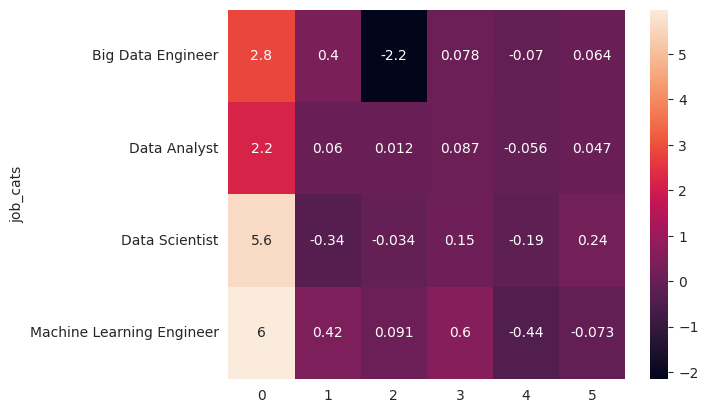

In [ ]:
sns.heatmap(
    lsi_sentences_vectors_grouped_df,
    annot = True
)

---

Looks like using sentences failed to capture differences between job cats.
Is using whole sentences in topic modelling wrong though?

Maybe the conclusion here is: the main topic of of job requirements column is 'job requirements in IT'. Furthermore we are looking here for a prescription to get a dream job, meanwhile we uncover the HR dream about perfect employee. Such employee has both high technical and communication skills. They are teamworkers and hold many other wonderful features.

---

Let's check how other models do and then analyze the distribution of tech skills between job cats.

---

### 9.3. Hierarchical Drichlet Process

#### 9.3.1. Build the model, show topics

In [ ]:
hdp_sentences_model = HdpModel(
    corpus=gensim_sentences_corpus,
    T=7,
    id2word=gensim_sentences_dictionary
)

In [ ]:
hdp_sentences_model.show_topics()

[(0,
  '0.009*knowledge of source code management tools, e.g. github. + 0.008*knowledge of good big data processing practices, including design, coding, documentation, testing and implementation standards + 0.007*understand and experience implementing software engineering best practices + 0.007*interest in the online market, + 0.006*you know the following packages very well: scikit-learn, pandas, tensorflow/keras and can use solutions implemented in other available python packages + 0.006*excellent communication skills, guiding team collaboration and ensuring alignment with objectives. + 0.006*experience using job scheduling tools, like airflow, is desirable but not required + 0.006* skills and experience  + 0.005*advanced understanding of sql programming and relational database system + 0.005*excellent written and verbal communications skills + 0.005*responsible and conscientious approach to assigned duties + 0.005*min. 3 years of professional experience as a programmer of data-intens

---

New problem arises: when You use whole sentences in topic modelling You encounter too complex topics. It is hard to outline significant differences on the first - and second - glance. Let's proceed to between-job_cats topic distribution.

---

#### 9.3.2. Visualize topics vs job_cats distribution

In [ ]:
# Check
hdp_sentences_inferred_topics = [hdp_sentences_model.inference(chunk=[single_document]) for single_document in gensim_sentences_corpus ]
hdp_sentences_topics_df = pd.DataFrame(np.array(hdp_sentences_inferred_topics).squeeze())
hdp_sentences_topics_df

,0,1,2,3,4,5,6
0,0.188827,0.159232,0.138770,0.127033,12.290977,3.963082,0.132078
1,8.084800,5.254872,0.139037,0.127137,0.155205,0.106974,0.131975
2,0.184620,0.158949,0.139159,0.127233,0.156971,3.101091,0.131977
3,14.137576,0.159346,2.829652,5.479390,0.154962,0.106978,0.132097
4,0.187806,5.258962,0.138536,0.127078,0.154724,0.107019,3.025875
...,...,...,...,...,...,...,...
334,3.326751,0.159358,3.992495,0.127241,0.155214,0.107010,0.131932
335,0.187719,4.768085,2.522748,0.127138,0.155146,0.106993,0.132170
336,0.187292,0.159919,7.131119,0.127180,0.155213,0.106997,0.132279
337,0.189120,0.160299,0.139084,0.127065,0.155233,0.107030,14.122169


In [ ]:
hdp_sentences_vectors_grouped_df = hdp_sentences_topics_df.groupby(working_df['job_cats']).mean()
hdp_sentences_vectors_grouped_df

,0,1,2,3,4,5,6
job_cats,,,,,,,
Big Data Engineer,3.853179,1.211827,1.804537,0.978081,0.322452,0.842633,4.044434
Data Analyst,2.689382,2.035854,1.728454,1.133597,1.954490,0.609648,0.956268
Data Scientist,5.873630,3.428675,1.237032,1.086993,1.386329,0.505734,1.336780
Machine Learning Engineer,6.728166,3.744150,1.451476,1.273425,2.084894,1.093661,0.336994


<Axes: ylabel='job_cats'>

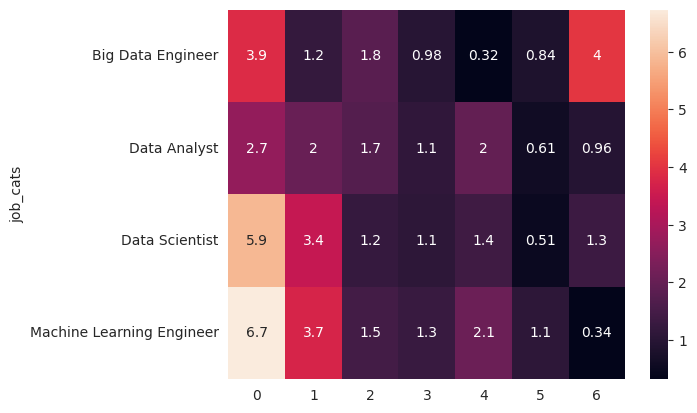

In [ ]:
sns.heatmap(
    hdp_sentences_vectors_grouped_df,
    annot = True
)

---

Again: sentence-level topic modeling shows less differences between job categories than earlier analyses.

---

### 9.4. Latent Drichlet Allocation

#### 9.4.1. Build the model, show topics

In [ ]:
lda_sentences_model = LdaModel(
    corpus=gensim_sentences_corpus,
    num_topics=7,
    id2word=gensim_sentences_dictionary,
    passes=13,
    iterations=71,
    random_state=SEED
)

In [ ]:
lda_sentences_model.show_topics()

[(0,
  '0.023*"knowledge of english at a level enabling reading documentation" + 0.023*"practical ability to use analytical tools, microsoft office, in particular microsoft excel (power query, vba), power bi, tableau or similar" + 0.023*"determination and flexible approach to solving problems" + 0.023*"independence, ability to organize one\'s own work" + 0.023*"good knowledge of sql (creating and optimizing existing queries and procedures) - a necessary condition" + 0.020*"ability to analyze and process data" + 0.020*"education in computer science" + 0.020*"familiarity with machine learning tools and technologies" + 0.020*"minimum 2 years of experience in the field of machine learning" + 0.020*"proficient in english communication"'),
 (1,
  '0.030*"database experience" + 0.030*"ai experience" + 0.025*"" + 0.016*"python development" + 0.014*"python / c++ development" + 0.010*"strong hands on coding skills, particularly python" + 0.010*"good written and verbal articulation skills (englis

#### 9.4.2. Visualize topic vs job_cats distribution

In [ ]:
lda_topics_per_document = [lda_sentences_model.get_document_topics(x) for x in gensim_sentences_corpus]

In [ ]:
a_list_for_topic_lda_sents_df = []
for document in lda_topics_per_document:
  document_dcts = {}
  for a_tuple in document:
    document_dcts[a_tuple[0]] = a_tuple[1]
  a_list_for_topic_lda_sents_df.append(document_dcts)

In [ ]:
lda_sentences_topic_per_document_probabilities = pd.DataFrame(a_list_for_topic_lda_sents_df, columns= np.arange(7)).fillna(0.0)

In [ ]:
lda_sentences_topic_per_document_probabilities.describe()

,0,1,2,3,4,5,6
count,339.000000,339.000000,339.000000,339.000000,339.000000,339.000000,339.000000
mean,0.089903,0.140072,0.119872,0.045818,0.075361,0.431989,0.081250
std,0.253967,0.311207,0.294643,0.177706,0.236402,0.460575,0.246097
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.013049,0.000000
50%,0.010989,0.011906,0.011913,0.010991,0.010992,0.035714,0.011906
75%,0.015873,0.017857,0.019160,0.015884,0.017857,0.946422,0.017857
max,0.934065,0.938775,0.938724,0.946373,0.954857,0.979587,0.965714


---

Topic 5 has significantly higher mean probability. Nevertheless we will check visually the distribution.

---

In [ ]:
lda_sentences_probabilities_grouped_df = lda_sentences_topic_per_document_probabilities.groupby(working_df['job_cats']).mean()
lda_sentences_probabilities_grouped_df

,0,1,2,3,4,5,6
job_cats,,,,,,,
Big Data Engineer,0.084494,0.086025,0.011027,0.011026,0.088158,0.416083,0.284480
Data Analyst,0.229419,0.185816,0.128085,0.027048,0.126153,0.244110,0.054251
Data Scientist,0.039295,0.150213,0.134863,0.034665,0.065742,0.467552,0.090694
Machine Learning Engineer,0.073510,0.112921,0.131598,0.088955,0.050314,0.512970,0.009681


<Axes: ylabel='job_cats'>

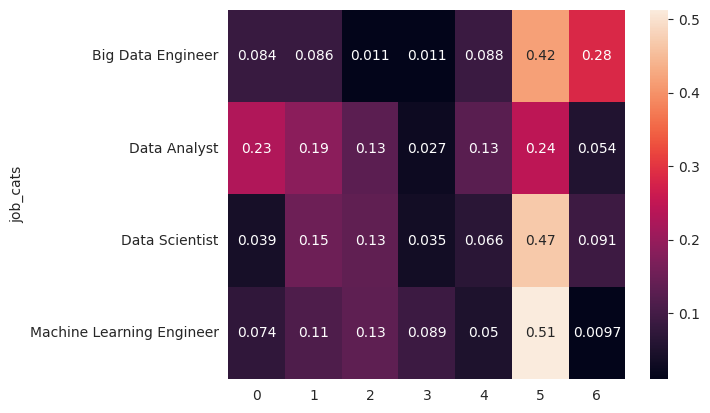

In [ ]:
sns.heatmap(
    lda_sentences_probabilities_grouped_df,
    annot=True
)

---

Once again: Big Data Engineer seems to be a bit different fron other job cats, but one of the topics is dominant across all of job cats.

---

### 9.5. Non-Negative Matrix factorization

#### 9.5.1. Build the model, show topics

In [ ]:
nmf_model_sentences = Nmf(
    corpus=gensim_sentences_corpus,
    num_topics=7,
    id2word=gensim_sentences_dictionary,
    random_state=SEED
)

In [ ]:
nmf_model_sentences.show_topics()

[(0,
  '0.442*"" + 0.010*"knowledge of source code management tools, e.g. github." + 0.010*"higher education (mathematics, computer science or other science)." + 0.010*"knowledge of machine learning algorithms." + 0.010*"punctuality, accuracy, inquisitiveness, task-oriented." + 0.010*"experience configuring and interacting with rest apis." + 0.010*"experience in working with large data sets." + 0.010*"knowledge in the field of ci/cd." + 0.010*"knowledge of machine learning, statistics, simulation, optimization." + 0.010*"minimum 3 years of experience as a data scientist."'),
 (1,
  '0.019*"experience in terraform, airflow" + 0.018*"experience with streaming platforms, typically based around kafka" + 0.018*"experience using databricks" + 0.018*"fluency with at least one dialect of sql" + 0.018*"level of english: upper-intermediate" + 0.018*"proficiency in spark" + 0.018*"strong experience using jira, slack, jetbrains ides, git, gitlab, github, docker, jenkins" + 0.017*"strong grasp of a

#### 9.5.2. Visualize topic vs job_cats distribution

In [ ]:
nmf_sentences_topics_per_document = [nmf_model_sentences.get_document_topics(x) for x in gensim_sentences_corpus]

In [ ]:
nmf_sentences_topics_per_document[:3]

[[(0, 0.3366145310062157),
  (2, 0.024967133159497185),
  (5, 0.1580996750813641),
  (6, 0.4803186607529231)],
 [(4, 1.0)],
 [(1, 0.34472155710888647), (6, 0.6552784428911135)]]

In [ ]:
a_list_for_topic_nmf_sents_df = []
for document in nmf_sentences_topics_per_document:
  document_dcts = {}
  for a_tuple in document:
    document_dcts[a_tuple[0]] = a_tuple[1]
  a_list_for_topic_nmf_sents_df.append(document_dcts)

In [ ]:
nmf_sentences_topic_per_document_probabilities = pd.DataFrame(a_list_for_topic_nmf_sents_df, columns= np.arange(7)).fillna(0.0)

In [ ]:
nmf_sentences_topic_per_document_probabilities.describe()

,0,1,2,3,4,5,6
count,339.000000,339.000000,339.000000,339.000000,339.000000,339.000000,339.000000
mean,0.150603,0.145857,0.172051,0.130920,0.165633,0.104707,0.129340
std,0.252337,0.282360,0.248410,0.248732,0.262743,0.217850,0.271494
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.035724,0.000000,0.015508,0.000000,0.018039,0.000000,0.000000
75%,0.157781,0.122089,0.386662,0.147253,0.211765,0.125802,0.060674
max,0.993308,1.000000,0.935421,1.000000,1.000000,1.000000,1.000000


In [ ]:
nmf_sentences_probabilities_grouped_df = nmf_sentences_topic_per_document_probabilities.groupby(working_df['job_cats']).mean()
nmf_sentences_probabilities_grouped_df

,0,1,2,3,4,5,6
job_cats,,,,,,,
Big Data Engineer,0.102274,0.342705,0.188095,0.220331,0.076413,0.027684,0.041842
Data Analyst,0.103382,0.157092,0.198746,0.188501,0.095247,0.137902,0.118229
Data Scientist,0.164645,0.151782,0.125674,0.090830,0.216256,0.088451,0.161590
Machine Learning Engineer,0.179590,0.055656,0.219158,0.119652,0.169435,0.135509,0.119854


<Axes: ylabel='job_cats'>

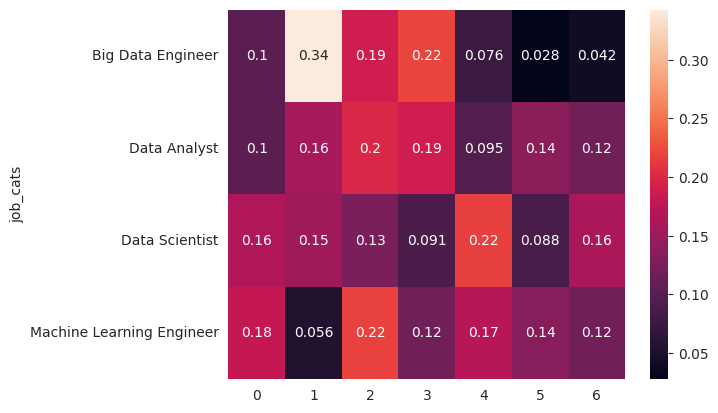

In [ ]:
sns.heatmap(
    nmf_sentences_probabilities_grouped_df,
    annot=True
)

## 10. Topic modeling - visual summary

In [ ]:
# Retrieve variables containing 'grouped' in their names
grouped_variables = [var_name for var_name in locals() if 'grouped' in var_name]

In [ ]:
grouped_variables

['lsi_words_vectors_grouped_df',
 'hdp_words_vectors_grouped_df',
 'lda_words_probabilities_grouped_df',
 'nmf_words_probabilities_grouped_df',
 'lsi_phrases_vectors_grouped_df',
 'hdp_phrases_vectors_grouped_df',
 'lda_phrases_probabilities_grouped_df',
 'nmf_phrases_probabilities_grouped_df',
 'lsi_sentences_vectors_grouped_df',
 'hdp_sentences_vectors_grouped_df',
 'lda_sentences_probabilities_grouped_df',
 'nmf_sentences_probabilities_grouped_df']

In [ ]:
# Define list with variables of iterest
word_level_topic_modeling = [
    lsi_words_vectors_grouped_df,
    hdp_words_vectors_grouped_df,
    lda_words_probabilities_grouped_df,
    nmf_words_probabilities_grouped_df
]

phrase_level_topics_modeling = [
    lsi_phrases_vectors_grouped_df,
    hdp_phrases_vectors_grouped_df,
    lda_phrases_probabilities_grouped_df,
    nmf_phrases_probabilities_grouped_df
]

sentence_level_topics_modeling = [
    lsi_sentences_vectors_grouped_df,
    hdp_sentences_vectors_grouped_df,
    lda_sentences_probabilities_grouped_df,
    nmf_sentences_probabilities_grouped_df
]

In [ ]:
model_names = [
    'Latent Semantic Indexing',
    'Hierarchical Drichlet Process',
    'Latent Drichlet Allocation',
    'Non-Negative Matrix factorization'
]

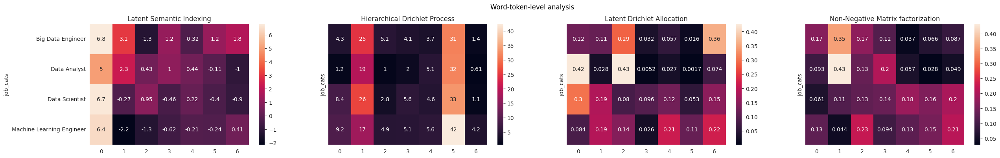

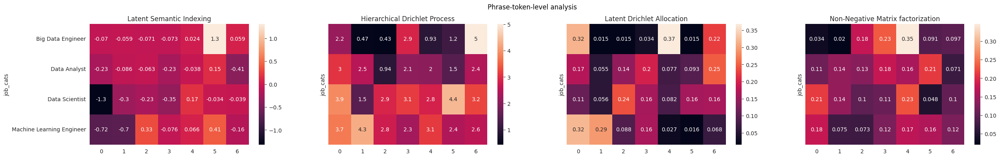

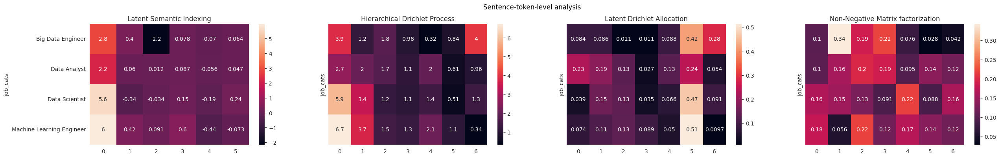

In [ ]:
# Plot comparison for word-level tokens
fig, axs = plt.subplots(
    ncols = 4,
    figsize = (30, 4),
    sharey=True
)

for df, axis, name in zip(word_level_topic_modeling, axs.flatten(), model_names):
  sns.heatmap(
      df,
      annot=True,
      ax=axis
  )
  axis.set_title(f'{name}')
plt.suptitle('Word-token-level analysis', fontdict=title_font_dct, y=1.01)
fig.tight_layout

plt.show()

# Plot comparison for phrase-level tokens
fig, axs = plt.subplots(
    ncols = 4,
    figsize = (30, 4),
    sharey=True
)

for df, axis, name in zip(phrase_level_topics_modeling, axs.flatten(), model_names):
  sns.heatmap(
      df,
      annot=True,
      ax=axis
  )
  axis.set_title(f'{name}')

plt.suptitle('Phrase-token-level analysis', fontdict=title_font_dct, y=1.01)
fig.tight_layout

plt.show()

# Plot comparison for sentence-level tokens
fig, axs = plt.subplots(
    ncols = 4,
    figsize = (30, 4),
    sharey=True
)

for df, axis, name in zip(sentence_level_topics_modeling, axs.flatten(), model_names):
  sns.heatmap(
      df,
      annot=True,
      ax=axis
  )
  axis.set_title(f'{name}')

plt.suptitle('Sentence-token-level analysis', fontdict=title_font_dct, y=1.01)
fig.tight_layout

plt.show()

---

In comaprison, we can observe that:
1. Non-Negative Matrix Factorization stands out in topic per job category distribution for all levels of analysis.
2. For both sentence-level and word-level tokenization LSI, HDP and LDA tend to produce one dominant topic, whereas at phrase-level tokenization they seem to find subtle differences between job categories.

---

Which level of tokenization is best isn't clear though, because:
1. The choice of phrases extracted using Matcher object might be considered arbitrary, while choice of sentences and words can not.
2. There is a possibility that job titles do not reflect job character.

---

Big Data Engineer stands out the most.

---

## 11. Job categories vs tech skills.


### 11.1 Required tech skills

In [ ]:
job_cats_req_tech_dct = {}
# Populate the dictionary
for (job_cat, a_series) in pd.Series(working_df.groupby('job_cats')['section-technologies-required']):
    job_cats_req_tech_dct[job_cat] = a_series

In [ ]:
job_cat_req_tech_df = pd.DataFrame(job_cats_req_tech_dct)

In [ ]:
job_cats_req_tech_counters_dct = {}
for column in job_cat_req_tech_df.columns:
    job_cats_req_tech_counters_dct[column] = Counter()
    for row_value in job_cat_req_tech_df[column].dropna().to_numpy():
      row_value = np.array(row_value)
      for element in row_value:
      # if element not in job_cats_req_tech_counters_dct[column]:
        job_cats_req_tech_counters_dct[column][element] +=1

In [ ]:
job_cats_req_tech_counted_df = pd.DataFrame(job_cats_req_tech_counters_dct)

In [ ]:
job_cat_req_tech_df.count().to_numpy()

array([ 35,  65, 145,  94])

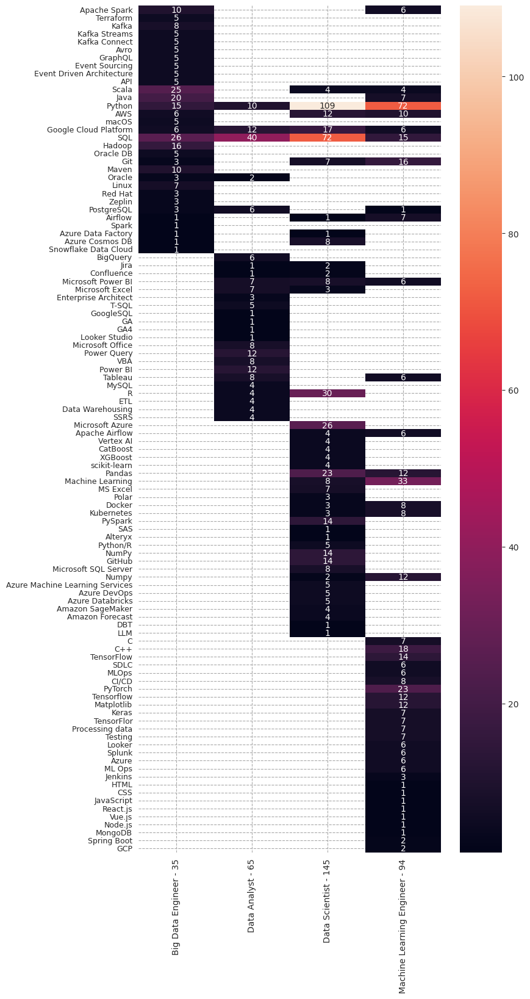

In [ ]:
fig, ax = plt.subplots(figsize=(8, 0.17*len(job_cats_req_tech_counted_df)))
sns.heatmap(
    job_cats_req_tech_counted_df,
    annot=True,
    fmt='.0f',
    xticklabels=True,
    yticklabels=True,
    ax=ax
)

plt.yticks(fontsize=9)
x_tick_labels = ax.get_xticklabels()

ax.set_xticklabels([f'{label.get_text()} - {count}' for label, count in zip(x_tick_labels, job_cat_req_tech_df.count().to_numpy())])

plt.show()

---

Now we have our data neatly presented, we can conclude that we were onto something when we performed topic modeling. Indeed Big Data Engineer is somewhat separate discipline and indeed Machine Learning Engineer incorporates competences from other discplines the most.

---

Now let's normalize the data column-wise, so we can see realtive importance of each tech.

---

In [ ]:
def standardize_col(column):
    mean_val = column.mean()
    std_dev = column.std()
    return (column - mean_val) / std_dev

In [ ]:
def compute_relative(column):
    return column/ column.sum()

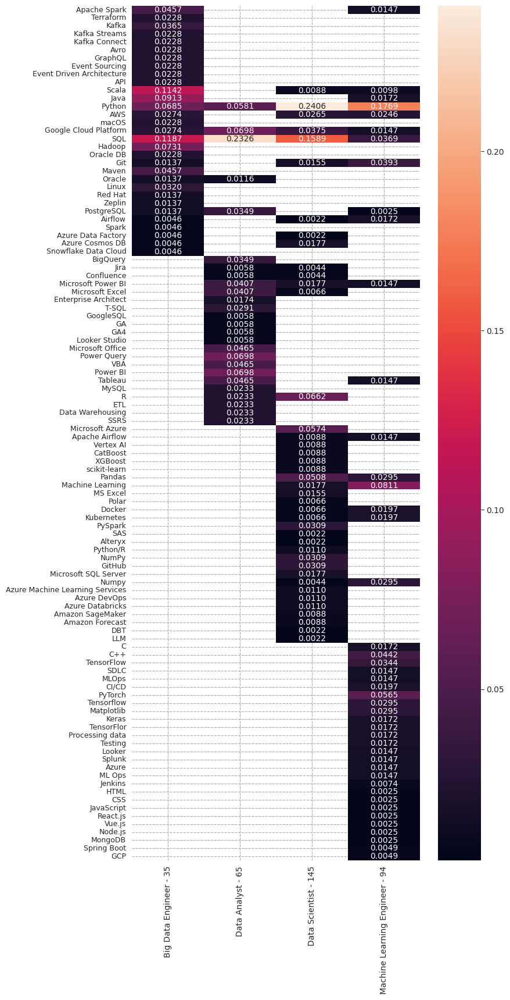

In [ ]:
fig, ax = plt.subplots(figsize=(8, 0.18*len(job_cats_req_tech_counted_df)))
sns.heatmap(
    job_cats_req_tech_counted_df.apply(compute_relative),
    annot=True,
    fmt='.4f',
    xticklabels=True,
    yticklabels=True,
    ax=ax
)

plt.yticks(fontsize=9)
x_tick_labels = ax.get_xticklabels()

ax.set_xticklabels([f'{label.get_text()} - {count}' for label, count in zip(x_tick_labels, job_cat_req_tech_df.count().to_numpy())])

plt.show()

---

Yep, now we can see that SQL is for Data Analyst position like Pyhon for Data Scientist.

---

### 11.2. Optional tech skills

In [ ]:
job_cats_opt_tech_dct = {}
# Populate the dictionary
for (job_cat, a_series) in pd.Series(working_df.groupby('job_cats')['section-technologies-optional']):
    job_cats_opt_tech_dct[job_cat] = a_series

In [ ]:
job_cat_opt_tech_df = pd.DataFrame(job_cats_opt_tech_dct)

In [ ]:
job_cats_opt_tech_counters_dct = {}
for column in job_cat_opt_tech_df.columns:
    job_cats_opt_tech_counters_dct[column] = Counter()
    for row_value in job_cat_opt_tech_df[column].dropna().to_numpy():
      row_value = np.array(row_value)
      for element in row_value:
        job_cats_opt_tech_counters_dct[column][element] +=1

In [ ]:
job_cats_opt_tech_counted_df = pd.DataFrame(job_cats_opt_tech_counters_dct)

In [ ]:
job_cats_opt_tech_counted_df

,Big Data Engineer,Data Analyst,Data Scientist,Machine Learning Engineer
Python,5.0,9.0,1.0,4.0
Kafka,15.0,NaN,1.0,4.0
Terraform,5.0,NaN,NaN,NaN
Apache Airflow,5.0,NaN,NaN,NaN
AWS,5.0,NaN,7.0,16.0
...,...,...,...,...
SciPy,NaN,NaN,NaN,7.0
MongoDB,NaN,NaN,NaN,6.0
C#,NaN,NaN,NaN,4.0
Pandas,NaN,NaN,NaN,4.0


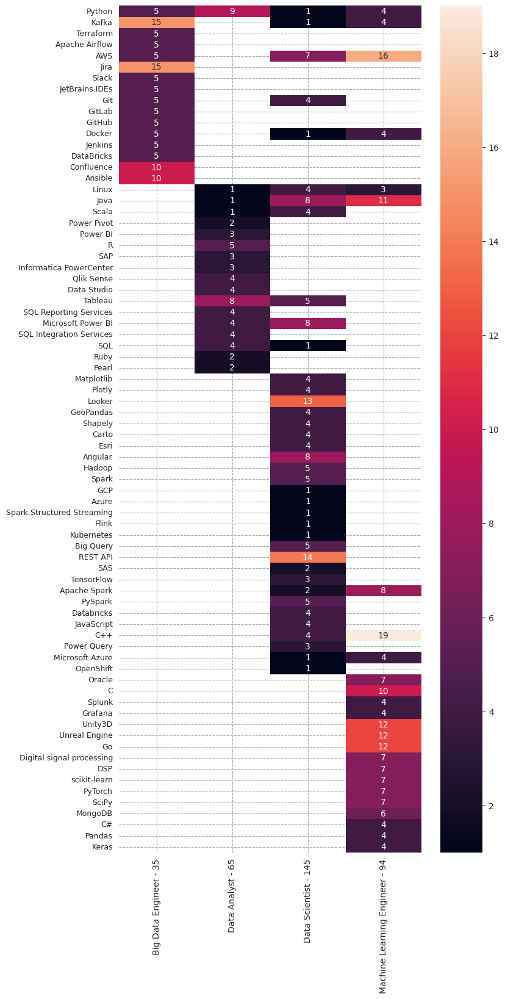

In [ ]:
fig, ax = plt.subplots(figsize=(8, 0.17*len(job_cats_req_tech_counted_df)))
sns.heatmap(
    job_cats_opt_tech_counted_df,
    annot=True,
    fmt='.0f',
    xticklabels=True,
    yticklabels=True,
    ax=ax
)

plt.yticks(fontsize=9)
x_tick_labels = ax.get_xticklabels()

ax.set_xticklabels([f'{label.get_text()} - {count}' for label, count in zip(x_tick_labels, job_cat_opt_tech_df.count().to_numpy())])

plt.show()

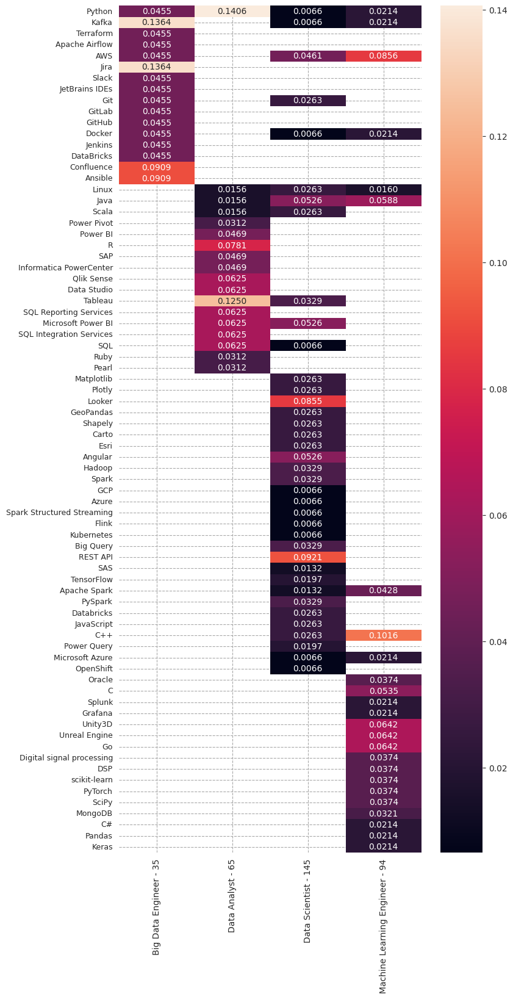

In [ ]:
fig, ax = plt.subplots(figsize=(8, 0.17*len(job_cats_req_tech_counted_df)))
sns.heatmap(
    job_cats_opt_tech_counted_df.apply(compute_relative),
    annot=True,
    fmt='.4f',
    xticklabels=True,
    yticklabels=True,
    ax=ax
)

plt.yticks(fontsize=9)
x_tick_labels = ax.get_xticklabels()

ax.set_xticklabels([f'{label.get_text()} - {count}' for label, count in zip(x_tick_labels, job_cat_opt_tech_df.count().to_numpy())])

plt.show()

## 12. Summary